## This notebook aims to visualize the different asset distributions produced by CGAN

In [1]:
import os
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
import sys
from tqdm import tqdm

parent_dir = os.path.abspath(os.path.join(os.getcwd(), "../../../"))
sys.path.insert(0, parent_dir)

from utilities.gan_plotting import extensive_plotting
from utilities.backtesting_plots import backtest_var_single_asset
from utilities.gan_plotting import load_generated_returns
from backtesting.perform_var_tests import perform_var_backtesting_tests
from backtesting.perform_distribution_tests import perform_distribution_tests
from utilities.gan_plotting import create_rolling_empirical
from sklearn.preprocessing import StandardScaler

from dotenv.main import load_dotenv
load_dotenv(override=True)
import os


In [2]:
import os
print(os.getcwd())

c:\Users\nicka\master-thesis\internal_models\GANs\tuned_GANS


### Parameters

In [3]:
assets_0 = int(os.getenv("INIT_ASSETS"))
liabilities_0 = int(os.getenv("INIT_ASSETS")) * float(os.getenv("FRAC_LIABILITIES"))
num_simulations = int(os.getenv("N_SIMULATIONS"))
bof_0 = assets_0 - liabilities_0

## Note to self -- We only test assets MSCIWORLD, HY and EONIA

In [4]:
def fetch_data_df():
    # Load the data
    df = pd.read_csv('../../../data/final_daily_returns_asset_classes.csv', index_col=0, parse_dates=True)
    df.index = pd.to_datetime(df.index)
    start_test_date = os.getenv("START_TEST_DATE")
    
    if start_test_date is None:
        raise ValueError("Environment variable 'START_TEST_DATE' is not set.")

    start_test_date = pd.to_datetime(start_test_date)

    columns = [0,1,2,3,4,5,6]#[0,1,2,4]
    selected_columns = df.iloc[:, columns]  # Remember: Python uses 0-based indexing

    pre_test_df = selected_columns[selected_columns.index < start_test_date]
    test_df = selected_columns[selected_columns.index >= start_test_date].iloc[:100]
    
    return pre_test_df, test_df

returns_df, test_returns_df = fetch_data_df()

In [5]:
asset_names = returns_df.columns

num_assets = returns_df.shape[1]
weights = np.full(num_assets, 1 / num_assets)  

## TRAINING CGAN

In [ ]:
from OliviaGAN import OliviaGAN
from MarketGAN import MarketGAN
from FashionGAN import FashionGAN

gan_dict = {}

for asset_name in tqdm(returns_df.columns, desc="Training GANs", unit="asset"):
    print(f"Training GAN for {asset_name}...")
    asset_returns = returns_df[asset_name]
    
    gan = FashionGAN(asset_returns, asset_name)
    gan.train()
    print(f"Finished training GAN for {asset_name}.\n")
    
    gan_dict[asset_name] = gan

Training GANs:   0%|          | 0/7 [00:00<?, ?asset/s]

Training GAN for REEL...


Processing Dates:   0%|          | 0/100 [00:00<?, ?dates/s]

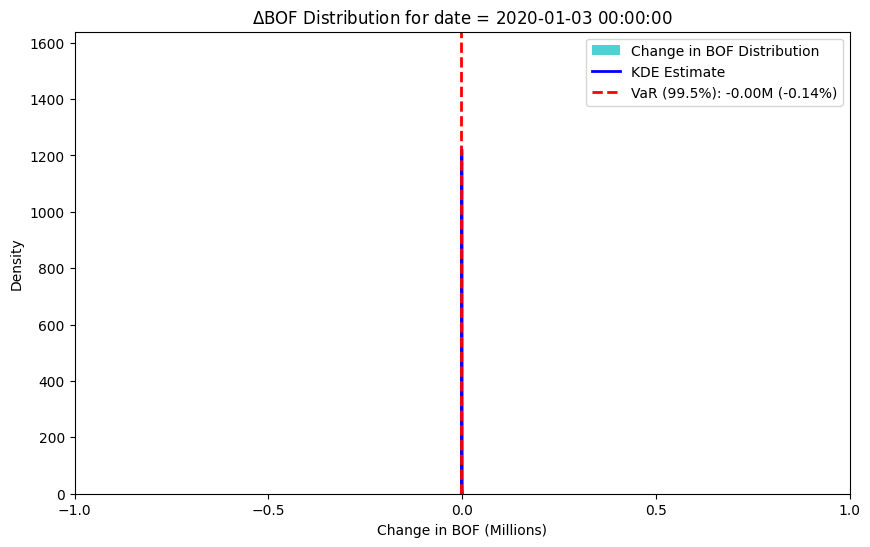

Processing Dates:  15%|█▌        | 15/100 [02:34<14:33, 10.28s/dates]


KeyboardInterrupt: 

In [ ]:
from internal_models.multivariate_GAN.simple_gan_portfolio import SimpleGANPortfolio
from utilities.bof_var_plot import plot_bof_var

portfolio_scr_results = {}  # key: date, value: scr

i = 0
for test_day in tqdm(test_returns_df.index, desc="Processing Dates", unit="dates"):
    i += 1

    gan_samples_cols = []
    for asset_name in returns_df.columns:
        gan = gan_dict[asset_name]
        new_return = test_returns_df.loc[test_day, asset_name]

        if test_day != test_returns_df.index[-1]:
            next_day = test_returns_df.index[test_returns_df.index.get_loc(test_day) + 1]
        else:
            print(f"Warning: {test_day} is the last day in the index, no next day available.")
            continue

        asset_scenarios = gan.generate_new_scenarios_from_return(new_return, test_day, 30, save=False, num_scenarios=10000)
        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1
        gan_samples_cols.append(asset_cum.reshape(-1, 1))

    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)

    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)
    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)

    if i % 16 == 0 or i == 1:
        plot_bof_var(bof_change,scr,r"$\Delta$BOF Distribution for date = " + str(next_day))

    if scr > 0: scr = 0.0

    portfolio_scr_results[next_day] = scr

In [ ]:
from internal_models.multivariate_GAN.simple_gan_portfolio import SimpleGANPortfolio
from internal_models.multivariate_GAN.students_copula_GAN import StudentCopula

## Making sure the window ends when we want to start testing

In [ ]:
entire_df = pd.concat([returns_df, test_returns_df])

In [ ]:
test_start_date = test_returns_df.index.min()
test_end_date = test_returns_df.index.max()
print("Test end date:", test_end_date)

# Find the index location of the test_start_date in entire_df
idx = entire_df.index.get_loc(test_end_date)
idx_start = entire_df.index.get_loc(test_start_date)

# Slice 252 rows before that index
historical_df = entire_df.iloc[idx_start - 252:]
historical_df.head()

Test end date: 2020-05-25 00:00:00


,REEL,PE,MSCIWORLD,IG,GOV,HY,EONIA
Date,,,,,,,
2019-01-03,0.000449,-0.016792,-0.017998,0.003209,-0.002739,0.000322,-0.00001
2019-01-04,0.017480,0.029982,0.025947,-0.004488,-0.002372,0.006997,-0.00001
2019-01-07,0.004902,0.016009,0.003607,0.000024,-0.001484,0.006122,-0.00003
2019-01-08,0.015357,0.012384,0.010125,-0.000592,-0.001053,0.004209,-0.00001
2019-01-09,-0.003836,0.003621,0.001916,0.001019,0.001938,0.004650,-0.00001


In [ ]:
# CALCULATE DELTA BOF ARRAY
eonia = historical_df.iloc[:, -1]
bof_0 = assets_0 - liabilities_0

In [ ]:
n_windows = len(historical_df) - 252 + 1

window_start_dates = []
window_end_dates = []
realized_bof_values = []
realized_delta_bof_values_1 = []

for t in range(n_windows):
    # Get window data
    window_data = historical_df.iloc[t:t+252]
    window_start_date = historical_df.index[t]
    window_end_date = historical_df.index[t+252-1]
    
    # Get returns and EONIA for this window
    window_returns = (window_data * weights).sum(axis=1)
    window_eonia = window_data.iloc[:, -1]
    
    # Calculate portfolio value at the end of the window
    # Starting from assets_0 each time
    portfolio_value_end = assets_0 * (1 + window_returns).prod() # This is analogous to the yearly return
    
    # Calculate liabilities at the end of the window
    # Starting from liabilities_0 each time
    liabilities_end = liabilities_0 * (1 + window_eonia).prod()
    
    # Calculate BOF at the end of the window
    bof_end = portfolio_value_end - liabilities_end
    delta_bof = bof_end - bof_0
    
    # Store results
    window_start_dates.append(window_start_date)
    window_end_dates.append(window_end_date)
    realized_bof_values.append(bof_end)
    realized_delta_bof_values_1.append(delta_bof)

## Does not work, since when we have a rolling BOF_0, and windows are overlapping, returns are counted over again multiple times, hence blowing up bof_0

To mitigate these i look at portfolio and liability values on a daily basis. I check the start and end values for all the different windows.

101


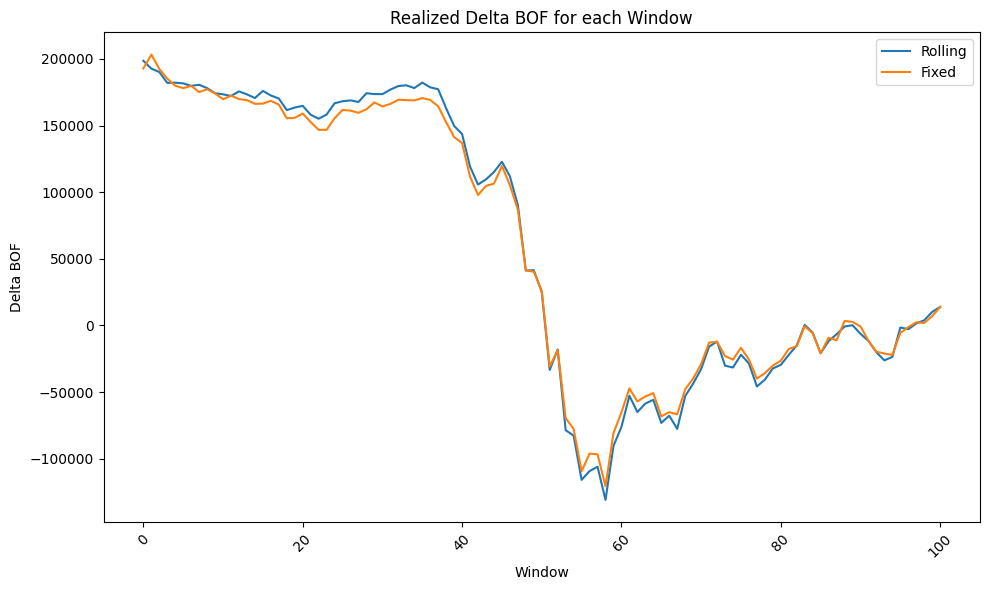

In [ ]:
n_windows = len(historical_df) - 252 + 1

window_start_dates = []
window_end_dates = []
realized_bof_values = []
realized_delta_bof_values = []

# For rolling approach, we need to track daily evolution of the portfolio
portfolio_values = [assets_0]  # Initialize with starting value
liability_values = [liabilities_0]  # Initialize with starting value

# First, calculate the full evolution of portfolio and liabilities day by day
for i in range(len(historical_df)):
    if i == 0:
        continue  # Skip first day as we already have initial values
        
    daily_return = (historical_df.iloc[i] * weights).sum()
    daily_eonia = historical_df.iloc[i, -1]
    
    new_portfolio_value = portfolio_values[-1] * (1 + daily_return)
    new_liability_value = liability_values[-1] * (1 + daily_eonia)
    
    portfolio_values.append(new_portfolio_value)
    liability_values.append(new_liability_value)

# Now calculate BOF for each window using the pre-calculated values
for t in range(n_windows):
    window_start_date = historical_df.index[t]
    window_end_date = historical_df.index[t+252-1]
    
    # Get BOF at start and end of window
    bof_start = portfolio_values[t] - liability_values[t]
    bof_end = portfolio_values[t+252-1] - liability_values[t+252-1]
    
    # Calculate delta BOF for this window
    delta_bof = bof_end - bof_start
    
    # Store results
    window_start_dates.append(window_start_date)
    window_end_dates.append(window_end_date)
    realized_bof_values.append(bof_end)
    realized_delta_bof_values.append(delta_bof)

print(len(realized_delta_bof_values_1))
plt.figure(figsize=(10, 6))
plt.plot(realized_delta_bof_values, linestyle='-', label="Rolling")
plt.plot(realized_delta_bof_values_1, linestyle='-', label="Fixed")
plt.xlabel("Window")
plt.ylabel("Delta BOF")
plt.title("Realized Delta BOF for each Window")
plt.xticks(rotation=45)
plt.grid(False)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
'''
from utilities.bof_var_plot import plot_bof_var

asset_names = list(returns_df.columns)
all_dates = sorted(list(scenarios_results[asset_names[0]].keys()))

portfolio_scr_results = {}  # key: date, value: scr

i = 0
for date in all_dates[:]:
    i += 1
    gan_samples_cols = []
    for asset in asset_names:
        asset_scenarios = scenarios_results[asset][date]  # expected shape: (n_simulations, window_size)
        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1

        if np.isnan(asset_cum).any() or np.isinf(asset_cum).any():
            print(f"Warning: NaN or Inf encountered in cumulative returns for asset {asset} on date {date}.")
        gan_samples_cols.append(asset_cum.reshape(-1, 1))

    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)
    
    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)
    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)
 
    if i % 16 == 0 or i == 1:
        plot_bof_var(bof_change,scr,r"$\Delta$BOF Distribution for date = " + str(date))
    
    if scr > 0: scr = 0.0
    
    portfolio_scr_results[date] = scr
    '''


<>:1: SyntaxWarning: invalid escape sequence '\D'
<>:1: SyntaxWarning: invalid escape sequence '\D'
C:\Users\nicka\AppData\Local\Temp\ipykernel_20444\3265619124.py:1: SyntaxWarning: invalid escape sequence '\D'
  '''


'\nfrom utilities.bof_var_plot import plot_bof_var\n\nasset_names = list(returns_df.columns)\nall_dates = sorted(list(scenarios_results[asset_names[0]].keys()))\n\nportfolio_scr_results = {}  # key: date, value: scr\n\ni = 0\nfor date in all_dates[:]:\n    i += 1\n    gan_samples_cols = []\n    for asset in asset_names:\n        asset_scenarios = scenarios_results[asset][date]  # expected shape: (n_simulations, window_size)\n        asset_cum = np.prod(1 + asset_scenarios, axis=1) - 1\n\n        if np.isnan(asset_cum).any() or np.isinf(asset_cum).any():\n            print(f"Warning: NaN or Inf encountered in cumulative returns for asset {asset} on date {date}.")\n        gan_samples_cols.append(asset_cum.reshape(-1, 1))\n\n    gan_samples = np.hstack(gan_samples_cols)  # shape: (n_simulations, n_assets)\n    \n    portfolio = SimpleGANPortfolio(gan_samples, weights, bof0_casei=-1)\n    bof_change, scr = portfolio.calculate_distribution_and_scr(case=2)\n \n    if i % 16 == 0 or i == 1:\

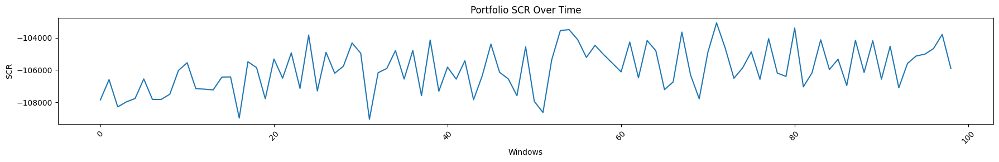

In [ ]:
sorted_dates = sorted(portfolio_scr_results.keys())
scr_values = [portfolio_scr_results[date] for date in sorted_dates]

plt.figure(figsize=(18, 3))
plt.plot(scr_values, linestyle='-')
plt.xlabel("Windows")
plt.ylabel("SCR")
plt.title("Portfolio SCR Over Time")
plt.xticks(rotation=45)
plt.grid(False)
plt.tight_layout()
plt.show()

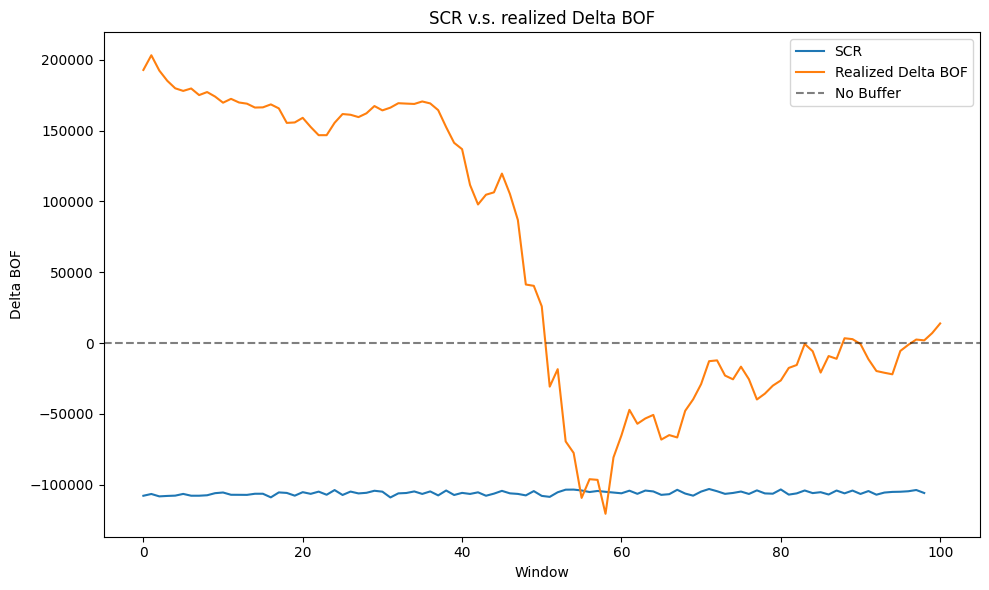

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(scr_values, linestyle='-', label='SCR')
plt.plot(realized_delta_bof_values_1, linestyle='-', label='Realized Delta BOF')

# Add a vertical dashed line - you can change the position as needed
plt.axhline(y=0, color='black', linestyle='--', label='No Buffer', alpha=0.5)

plt.xlabel("Window")
plt.ylabel("Delta BOF")
plt.title("SCR v.s. realized Delta BOF")
plt.grid(False)
plt.tight_layout()
plt.legend()
plt.show()

In [ ]:
from backtesting.perform_var_tests import evaluate_risk_metrics

evaluate_risk_metrics(scr_values, realized_delta_bof_values_1)

breaches [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


,Metric,Value,Description,Pass/Fail
0,Balanced SCR Loss (α=0.25),41715.8114,Penalty for under-conservatism,
1,Balanced SCR Loss (α=0.5),83431.6226,Penalty for balanced,
2,Balanced SCR Loss (α=0.75),125147.4338,Penalty for capital inefficiency,
3,Kupiec POF Test p-value,0.1070,Tests if breach frequency matches expected,✅
4,Indep. Test p-value,0.7728,Tests if breaches are independent,✅
5,Cond. Coverage p-value,0.2616,Combined test of frequency and independence,✅
6,Lopez Average Loss,0.0204,Quadratic loss function for VaR breaches,
7,Breach Rate,0.0202,Proportion of time when Delta BOF < SCR,


-------------------------------------------------------------------------------------------------------------------------------------------------------------------------
## SHOWING A BUNCH OF GAN SPESIFIC RESULTS

- Distributions
- Latent space plots
- PCAs

etc.

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_HY_final_scenarios.pt
Scaled = False
Loaded Generated returns from: generated_CGAN_output_test\generated_returns_EONIA_final_scenarios.pt
Scaled = False


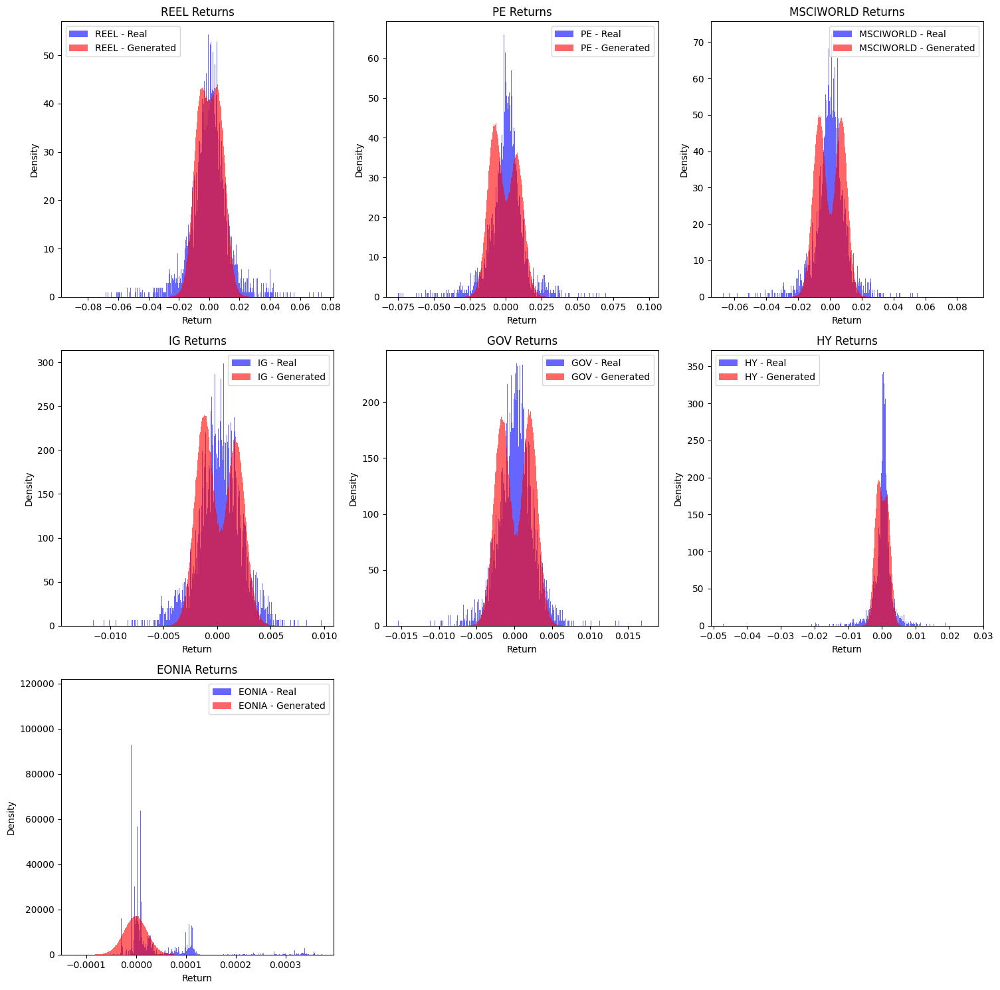


📊 Return Statistics Summary:
                Asset      Mean  Std Dev  Skewness  Kurtosis  99.5% VaR
          REEL - Real  0.000193 0.012916 -0.270455  4.969021  -0.051644
     REEL - Generated  0.000226 0.007727 -0.000249 -0.602707  -0.017639
            PE - Real  0.000224 0.012736 -0.303648  6.380382  -0.052287
       PE - Generated -0.000667 0.009342  0.113439 -0.895113  -0.020248
     MSCIWORLD - Real  0.000283 0.009887 -0.226726  7.359869  -0.037021
MSCIWORLD - Generated  0.000048 0.008127 -0.004103 -1.069697  -0.017065
            IG - Real  0.000182 0.002083 -0.458256  2.226597  -0.006788
       IG - Generated  0.000175 0.001745  0.085673 -1.038022  -0.003385
           GOV - Real  0.000183 0.002449 -0.034370  4.018610  -0.008100
      GOV - Generated  0.000174 0.002147 -0.007407 -1.085734  -0.004283
            HY - Real  0.000279 0.003002 -1.860565 31.424899  -0.012798
       HY - Generated  0.000070 0.001797  0.031854 -0.632511  -0.004055
         EONIA - Real  0.000032 0.

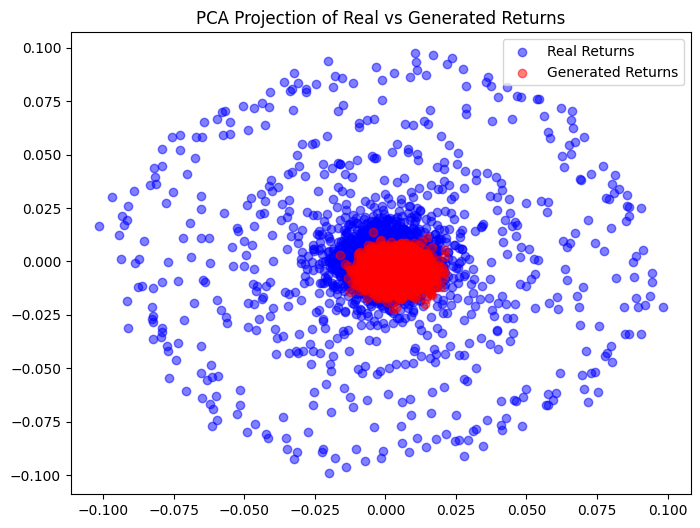

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt


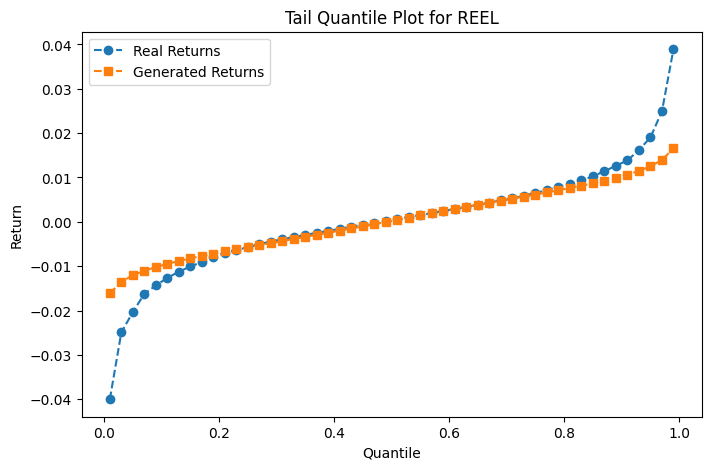


════════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: REEL  ║
════════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt

📊 Distance Summary for REEL:
Min Distance: 0.000000
Max Distance: 0.092157
Mean Distance: 0.001054
Median Distance: 0.000418
Standard Deviation: 0.002316


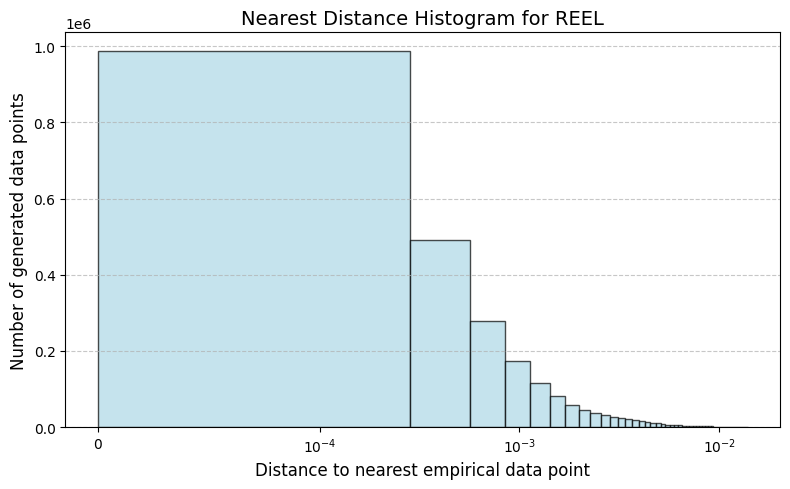


══════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: REEL  ║
══════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_REEL_final_scenarios.pt
📊 Wasserstein Distance for REEL: 0.002604


═════════════════════════
║  ANALYZING ASSET: PE  ║
═════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
Variance of Real Data: 0.000162
Variance of Generated Data: 0.000020
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data
Mean Pairwise Distance (Real): 0.268750
Mean Pairwise Distance (Generated): 0.100816
⚠️ Warning: Potential Mode Collapse - Samples are too similar


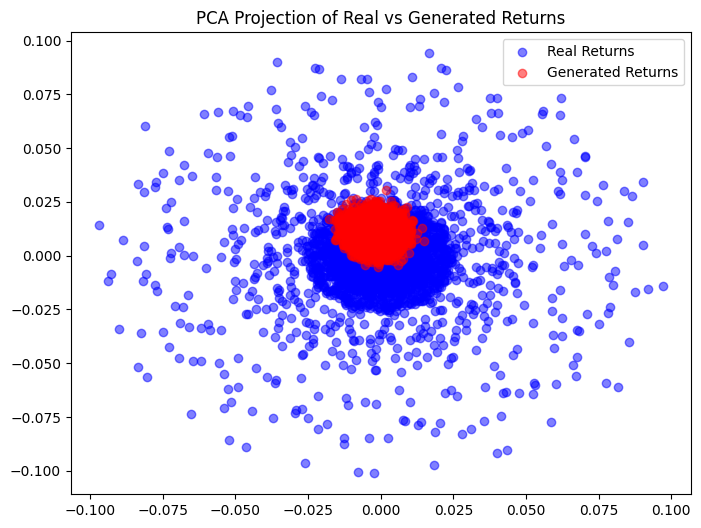

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt


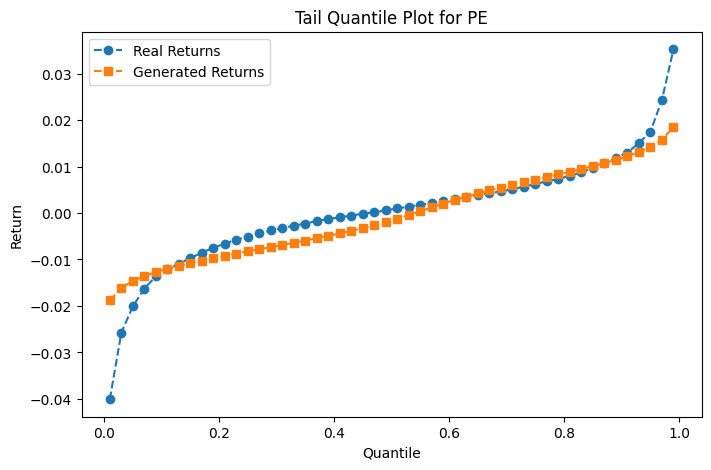


══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: PE  ║
══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt

📊 Distance Summary for PE:
Min Distance: 0.000000
Max Distance: 0.215610
Mean Distance: 0.001175
Median Distance: 0.000460
Standard Deviation: 0.002208


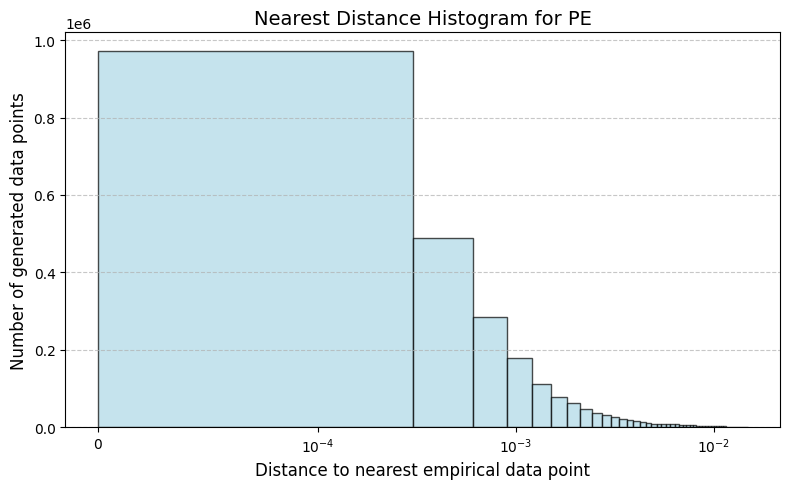


════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: PE  ║
════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_PE_final_scenarios.pt
📊 Wasserstein Distance for PE: 0.002997


════════════════════════════════
║  ANALYZING ASSET: MSCIWORLD  ║
════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
Variance of Real Data: 0.000098
Variance of Generated Data: 0.000013
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data
Mean Pairwise Distance (Real): 0.211255
Mean Pairwise Distance (Generated): 0.080157
⚠️ Warning: Potential Mode Collapse - Samples are too similar


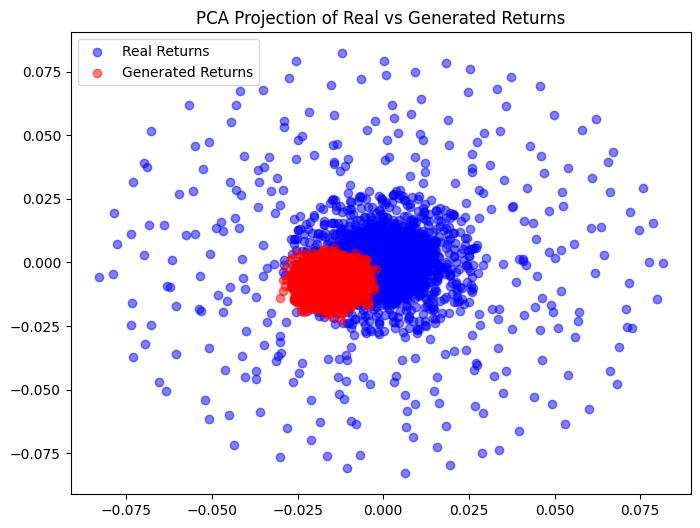

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt


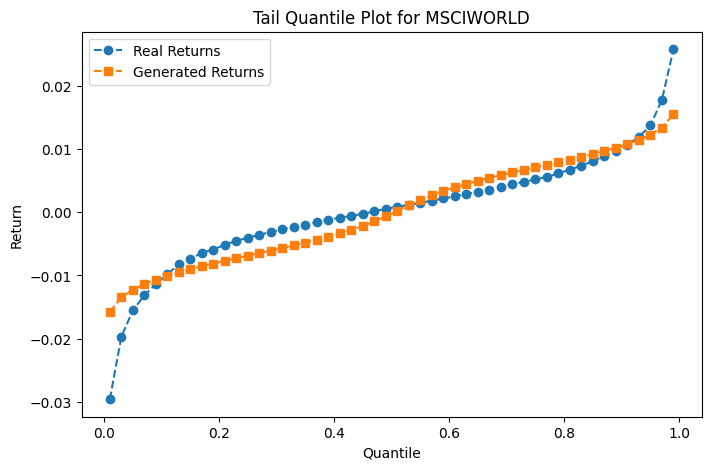


═════════════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: MSCIWORLD  ║
═════════════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt

📊 Distance Summary for MSCIWORLD:
Min Distance: 0.000000
Max Distance: 0.104358
Mean Distance: 0.001023
Median Distance: 0.000470
Standard Deviation: 0.001673


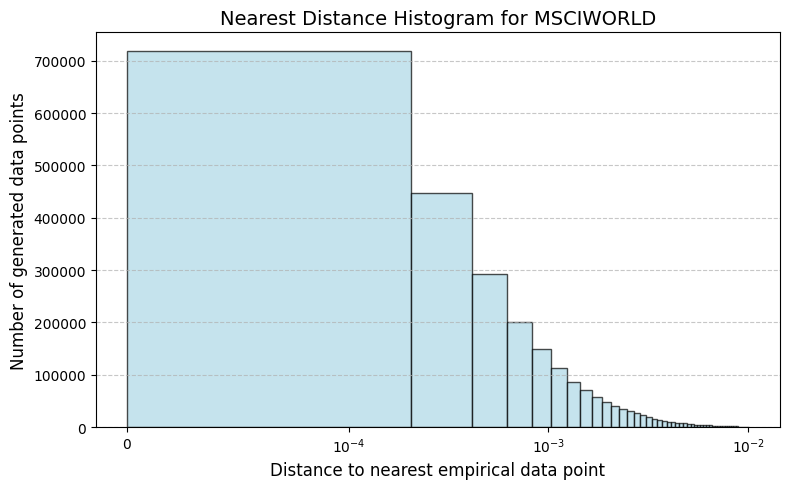


═══════════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: MSCIWORLD  ║
═══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_MSCIWORLD_final_scenarios.pt
📊 Wasserstein Distance for MSCIWORLD: 0.002415


═════════════════════════
║  ANALYZING ASSET: IG  ║
═════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
Variance of Real Data: 0.000004
Variance of Generated Data: 0.000001
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data
Mean Pairwise Distance (Real): 0.046002
Mean Pairwise Distance (Generated): 0.017131
⚠️ Warning: Potential Mode Collapse - Samples are too similar


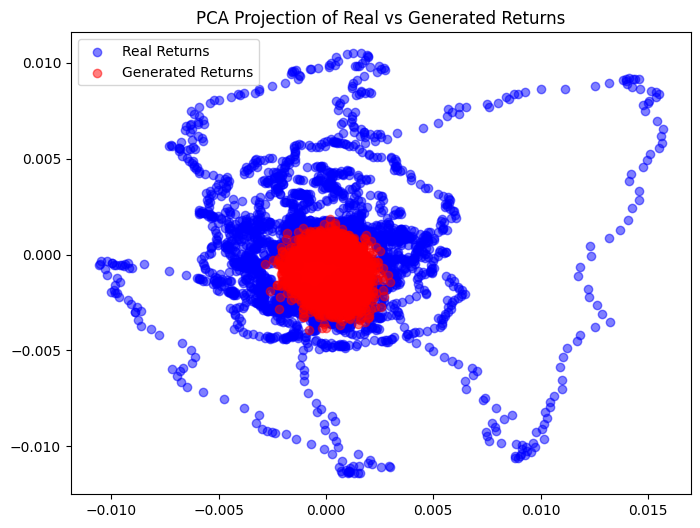

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt


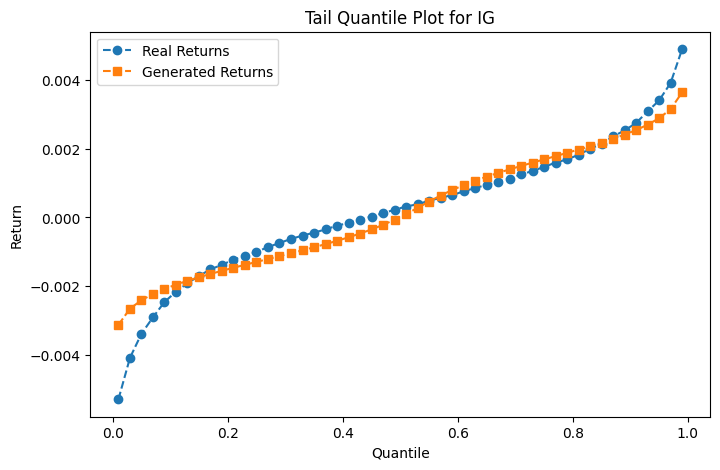


══════════════════════════════════════════════
║  COMPUTING NEAREST DISTANCE HISTOGRAM: IG  ║
══════════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt

📊 Distance Summary for IG:
Min Distance: 0.000000
Max Distance: 0.191957
Mean Distance: 0.000821
Median Distance: 0.000421
Standard Deviation: 0.001540


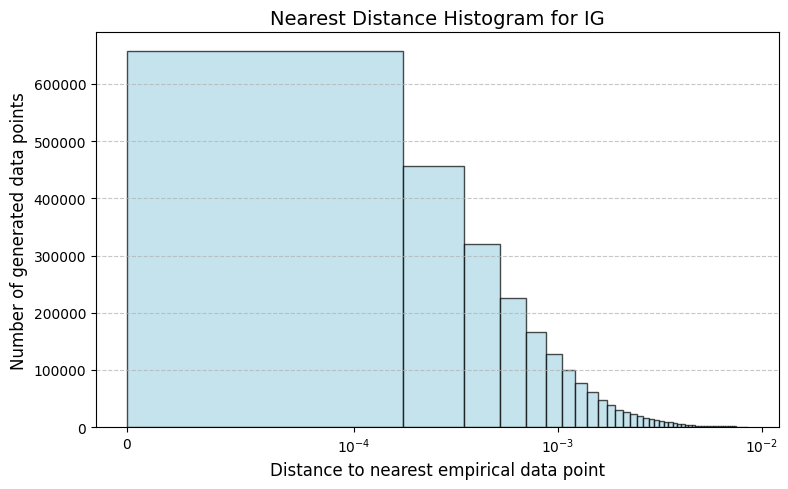


════════════════════════════════════════
║  COMPUTING WASSERSTEIN DISTANCE: IG  ║
════════════════════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_IG_final_scenarios.pt
📊 Wasserstein Distance for IG: 0.000382


══════════════════════════
║  ANALYZING ASSET: GOV  ║
══════════════════════════

Loaded Generated returns from: generated_CGAN_output_test\generated_returns_GOV_final_scenarios.pt
Variance of Real Data: 0.000006
Variance of Generated Data: 0.000001
⚠️ Warning: Possible Mode Collapse - Low Variance in Generated Data


KeyboardInterrupt: 

In [ ]:
extensive_plotting(scaled=False, returns_df=returns_df, test=True, quarterly=False)

# ----------------------------------------------------------

In [ ]:
from internal_models.GANs.explainability.visuals_3 import *
from internal_models.GANs.explainability.gan_visuals import *

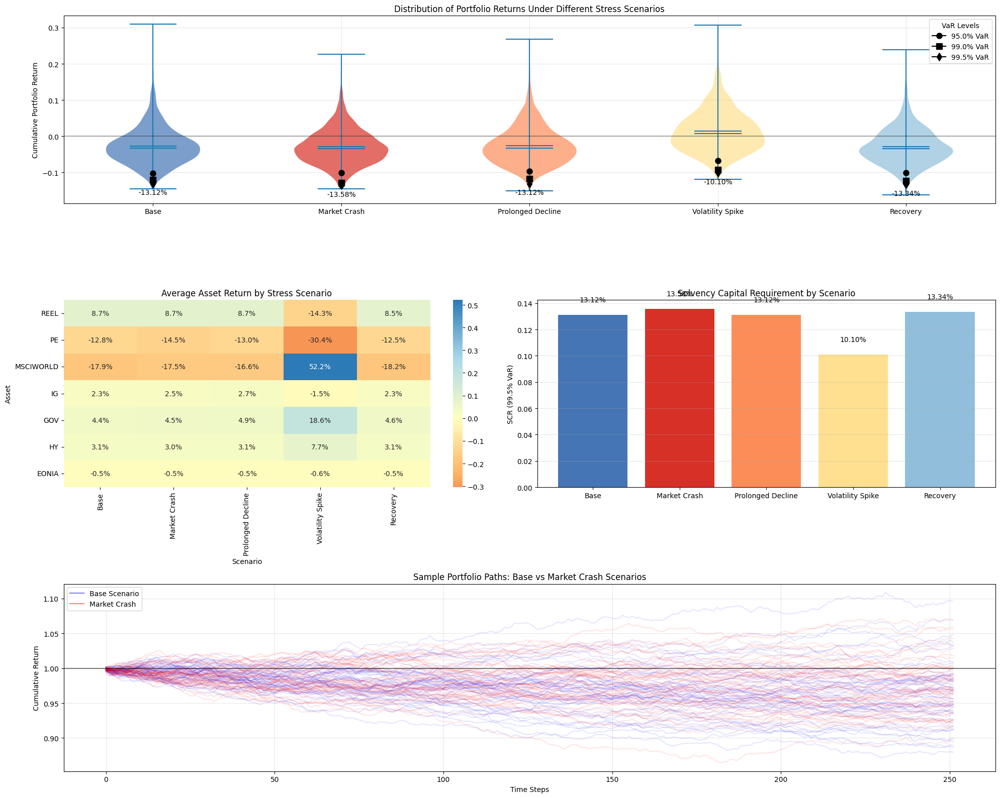

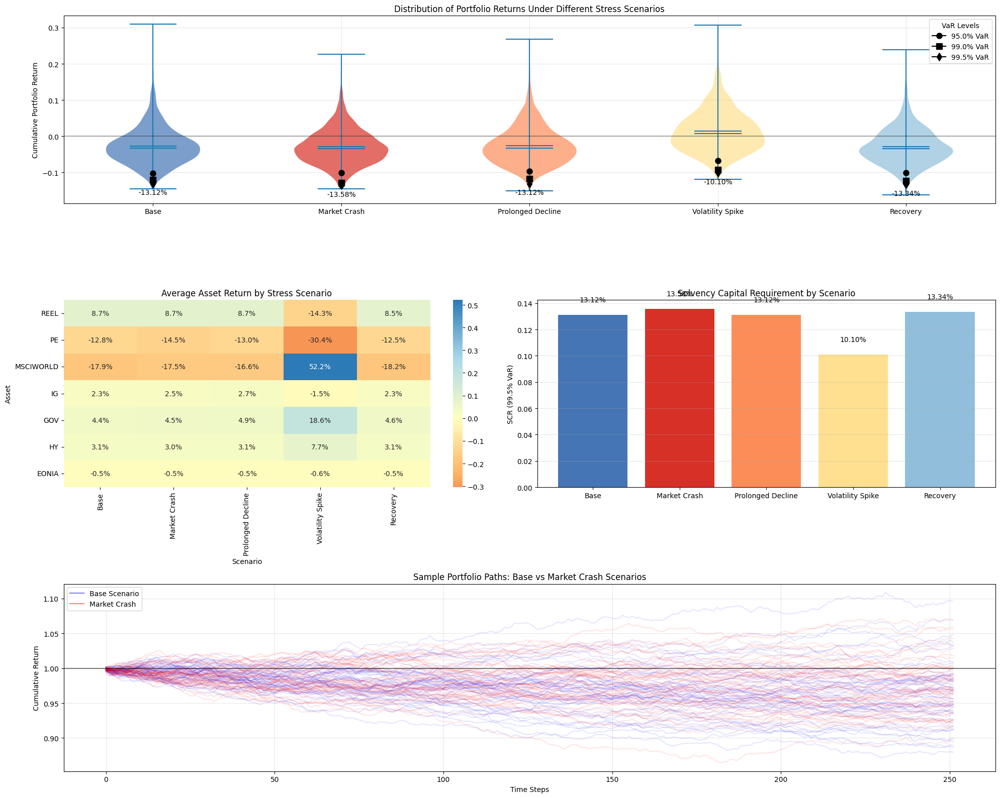

In [ ]:
visualize_stress_tests(gan_dict)

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


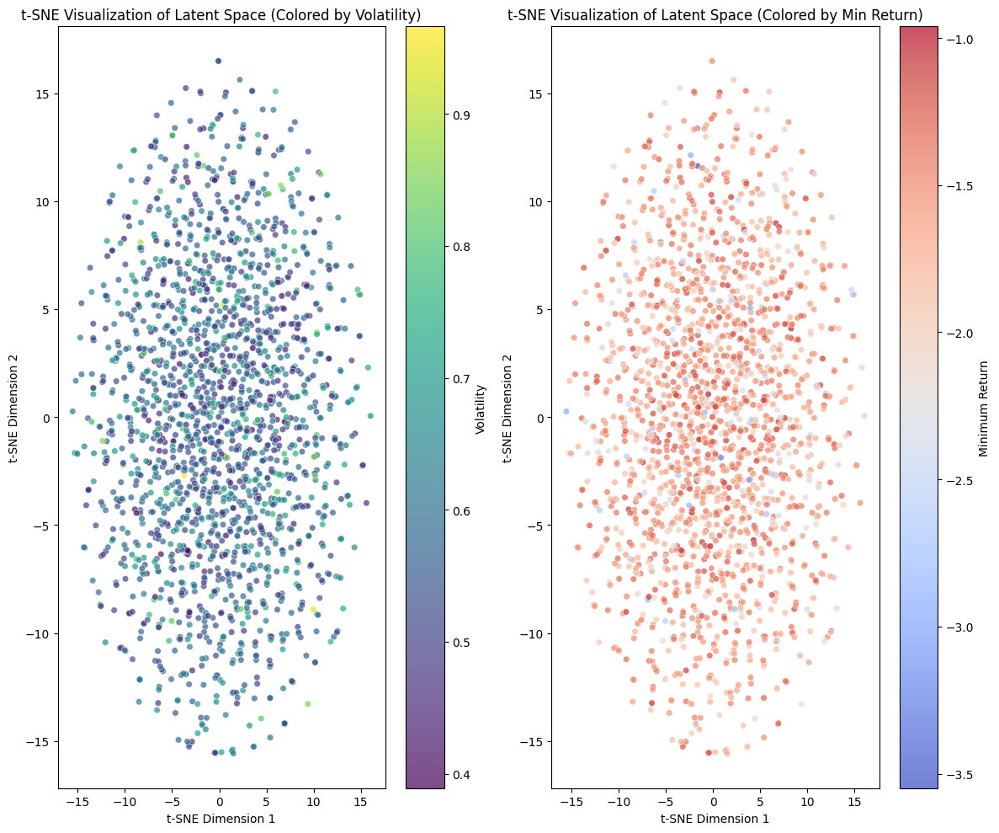

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


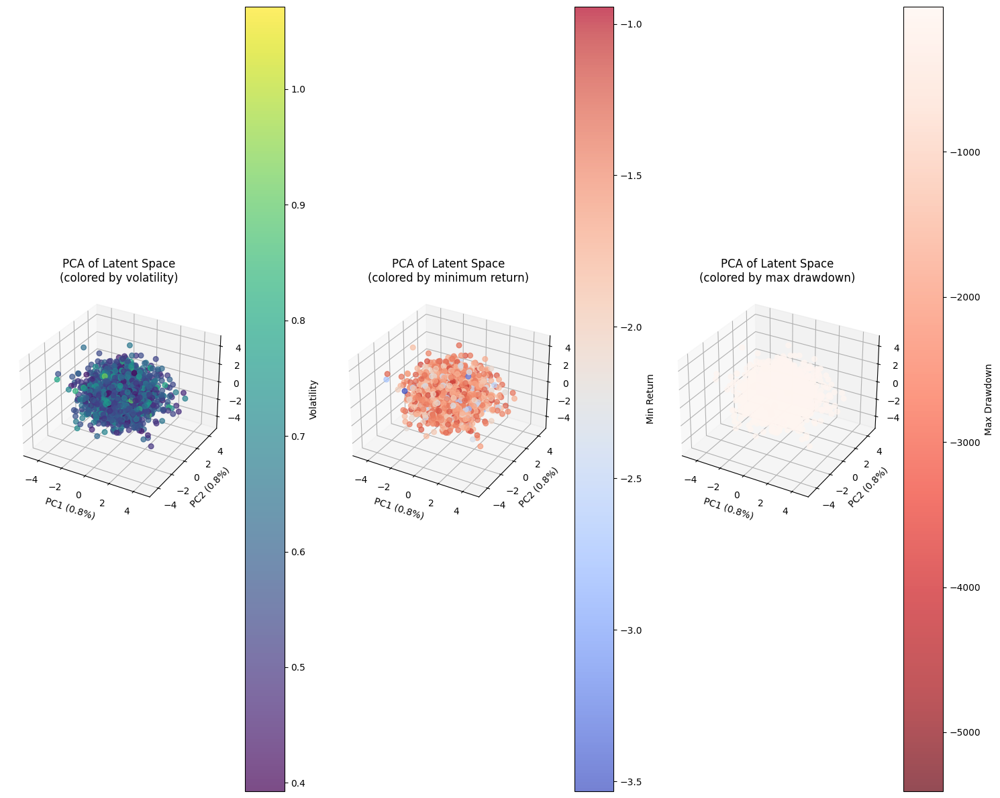

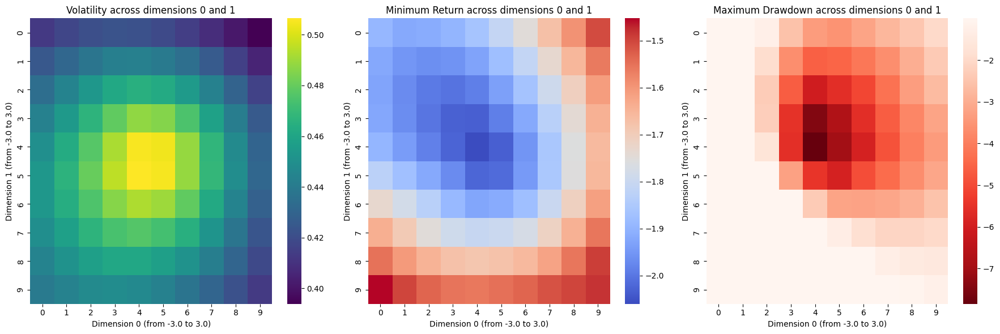

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.95it/s]


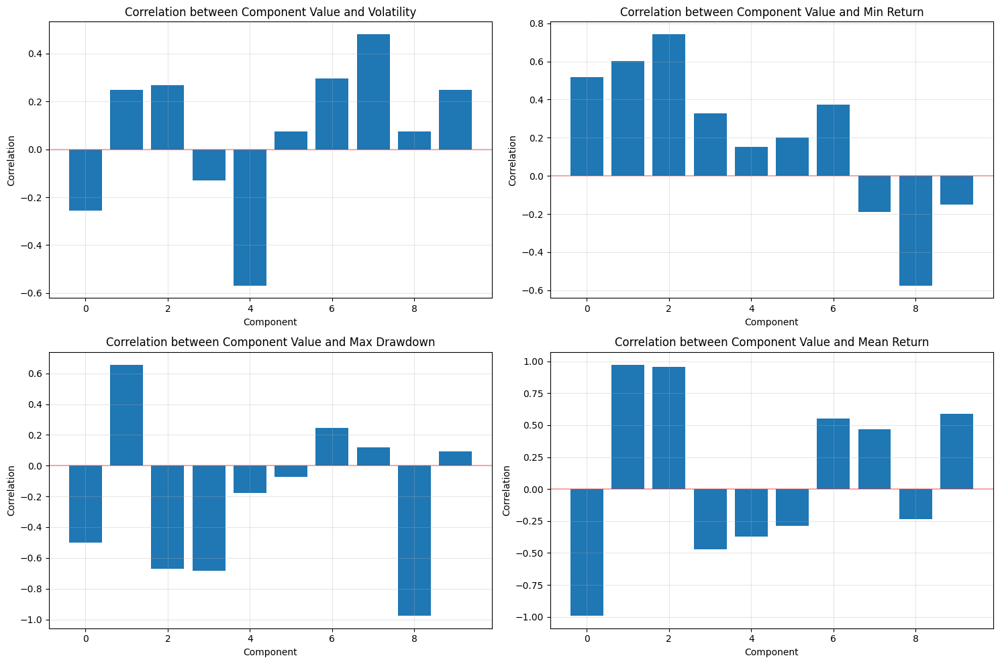

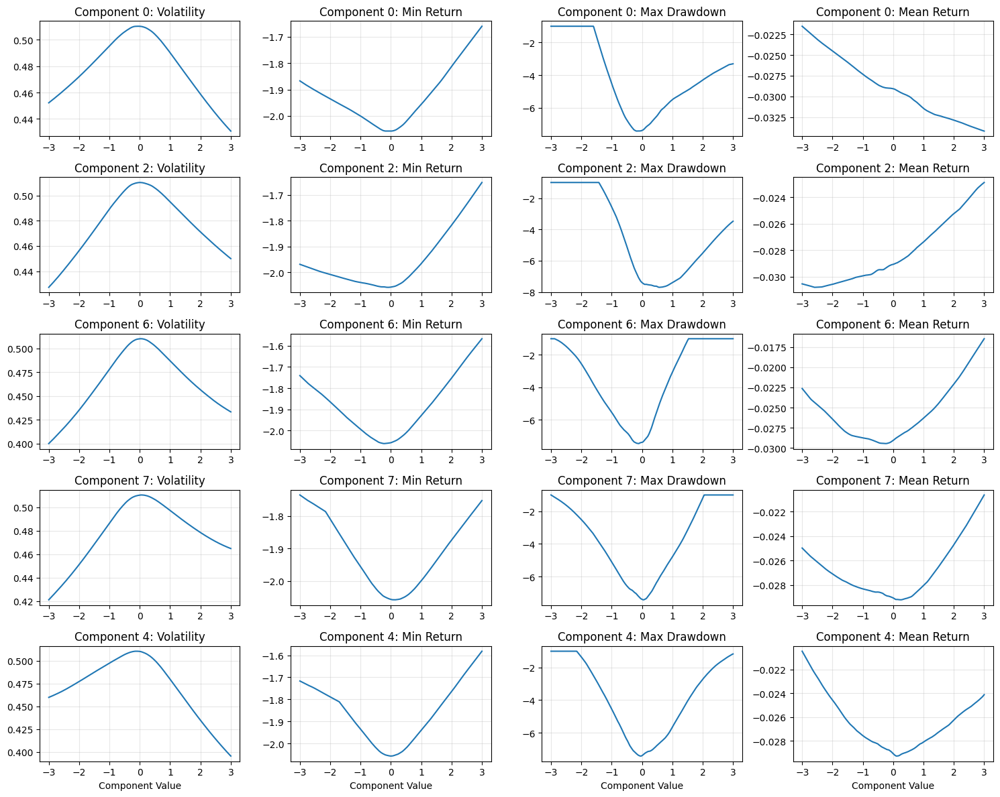

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


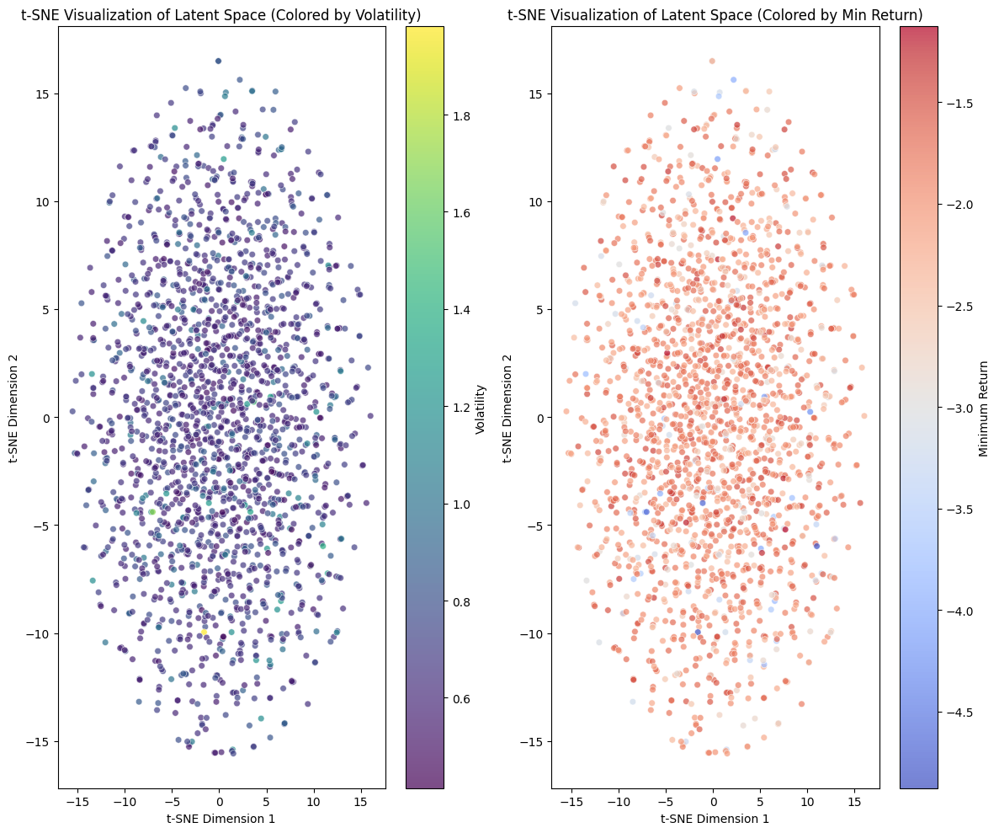

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


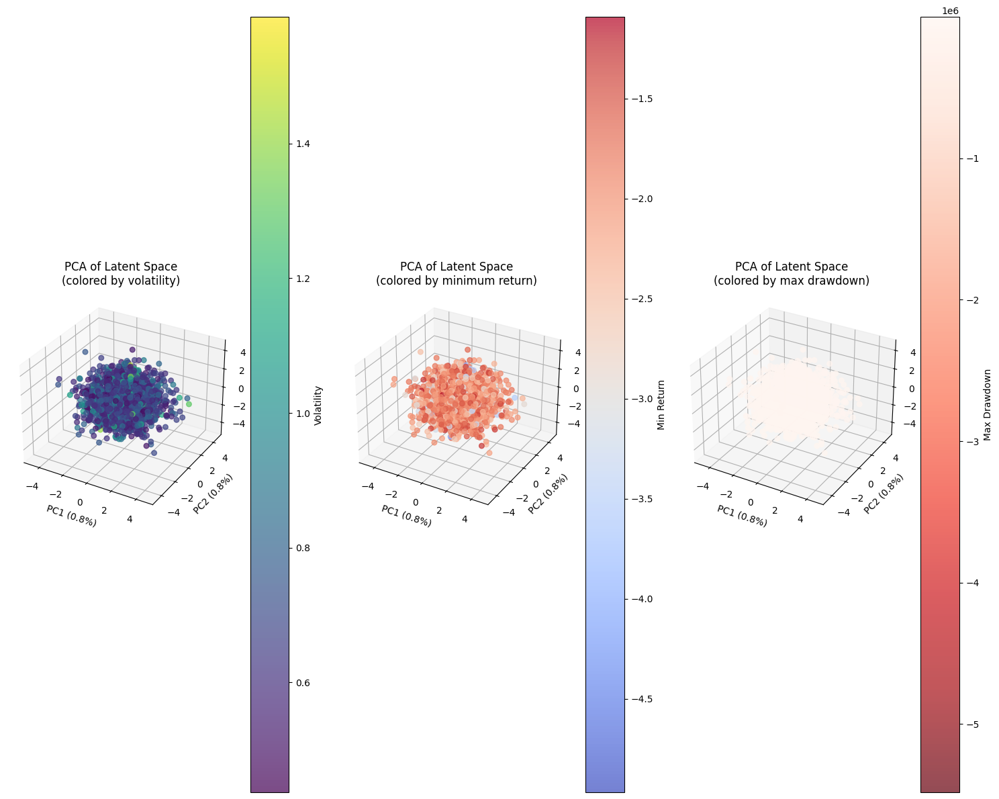

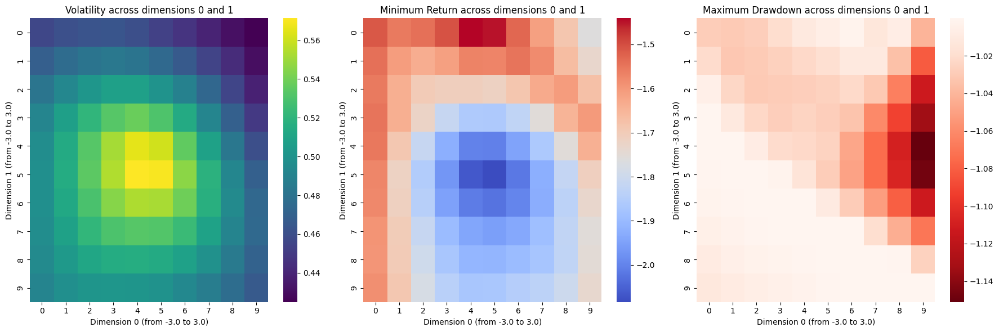

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.97it/s]


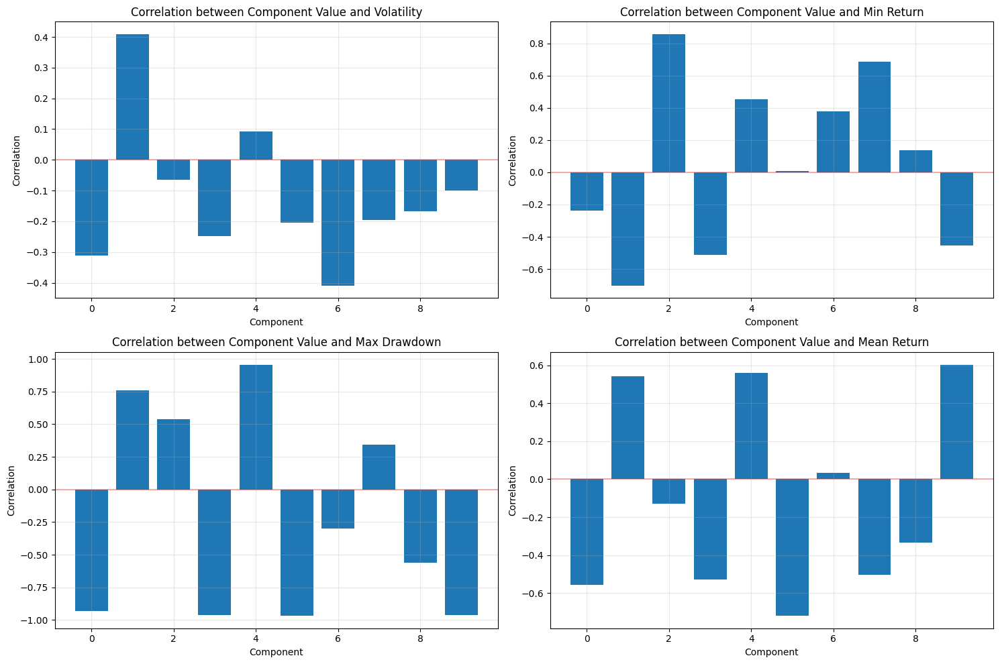

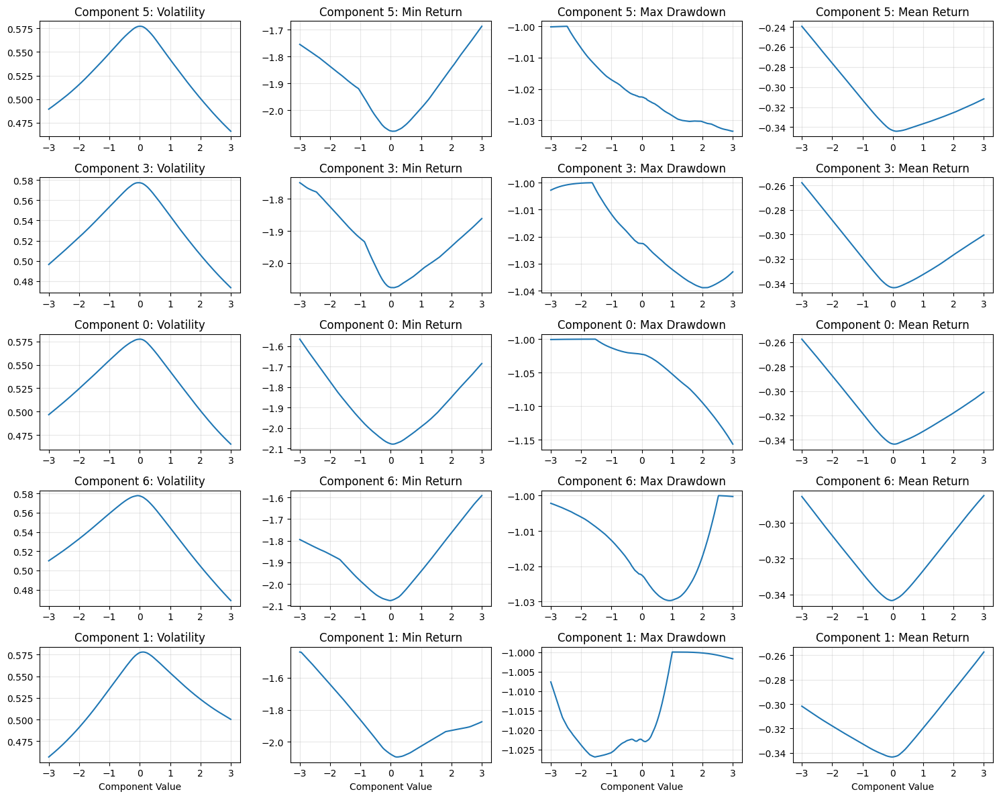

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


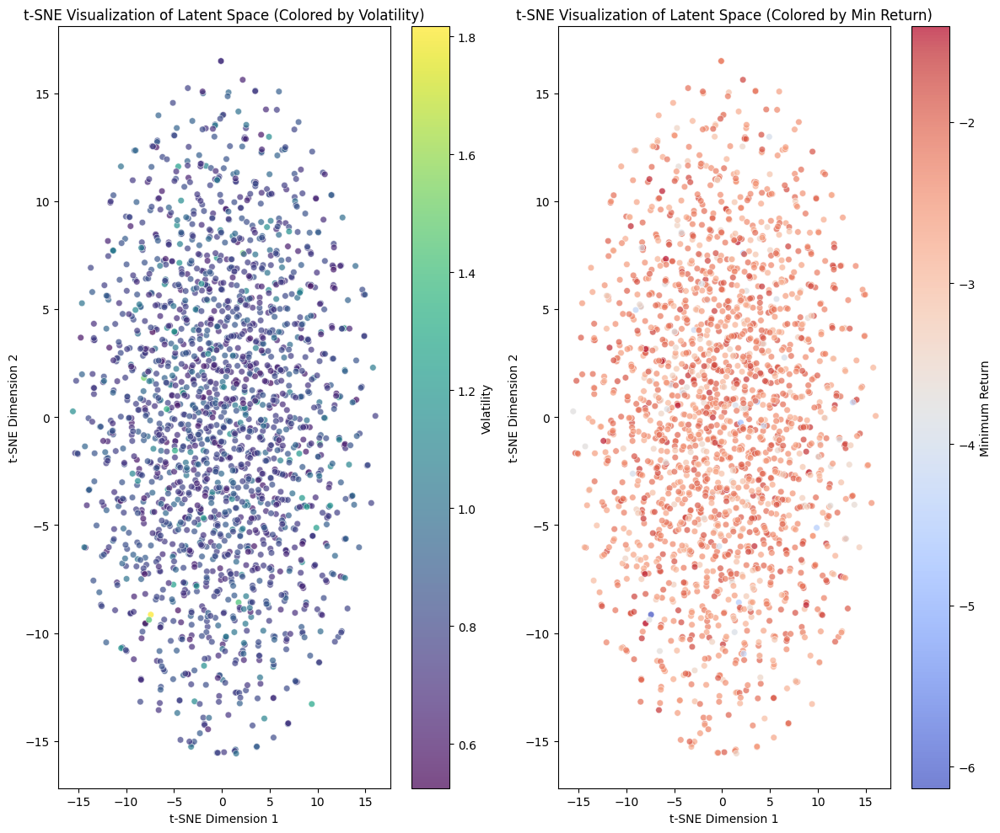

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:173: RuntimeWarning: overflow encountered in accumulate
  cum_returns = (1 + returns).cumprod()
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in subtract
  drawdowns = (cum_returns - running_max) / running_max
c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in divide
  drawdowns = (cum_returns - running_max) / running_max


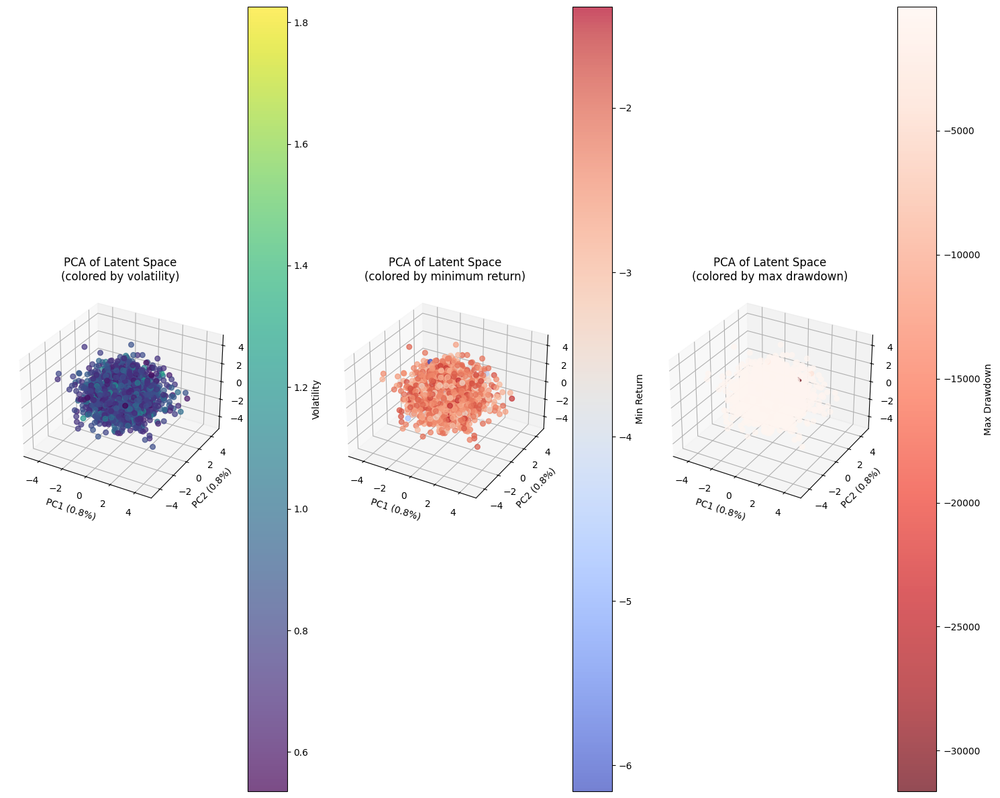

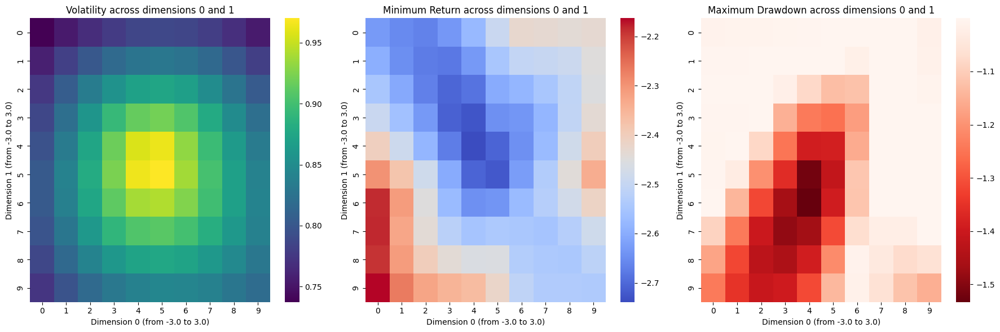

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  7.06it/s]


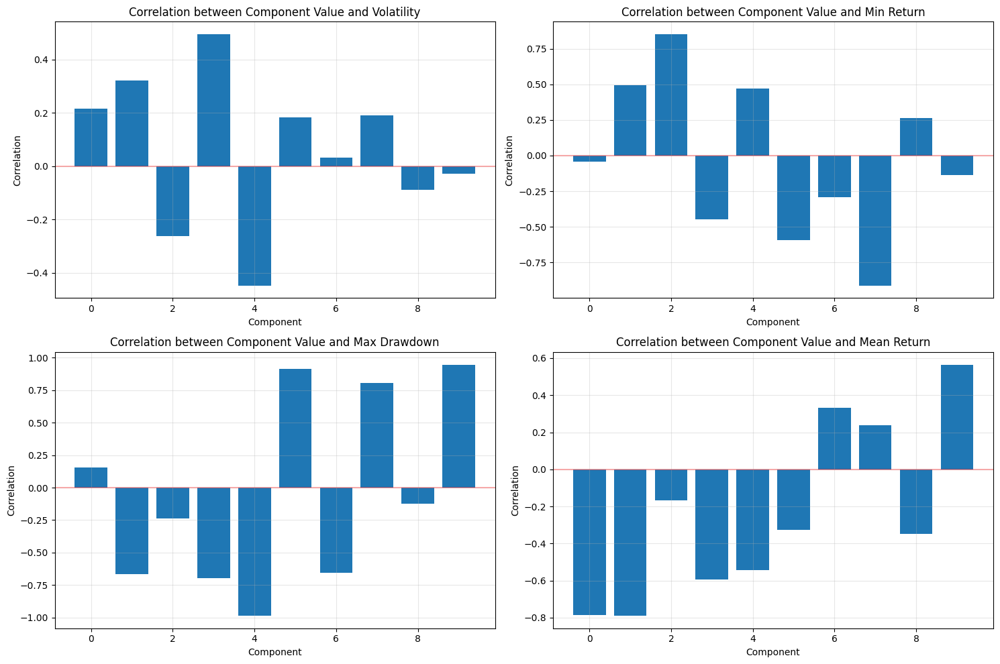

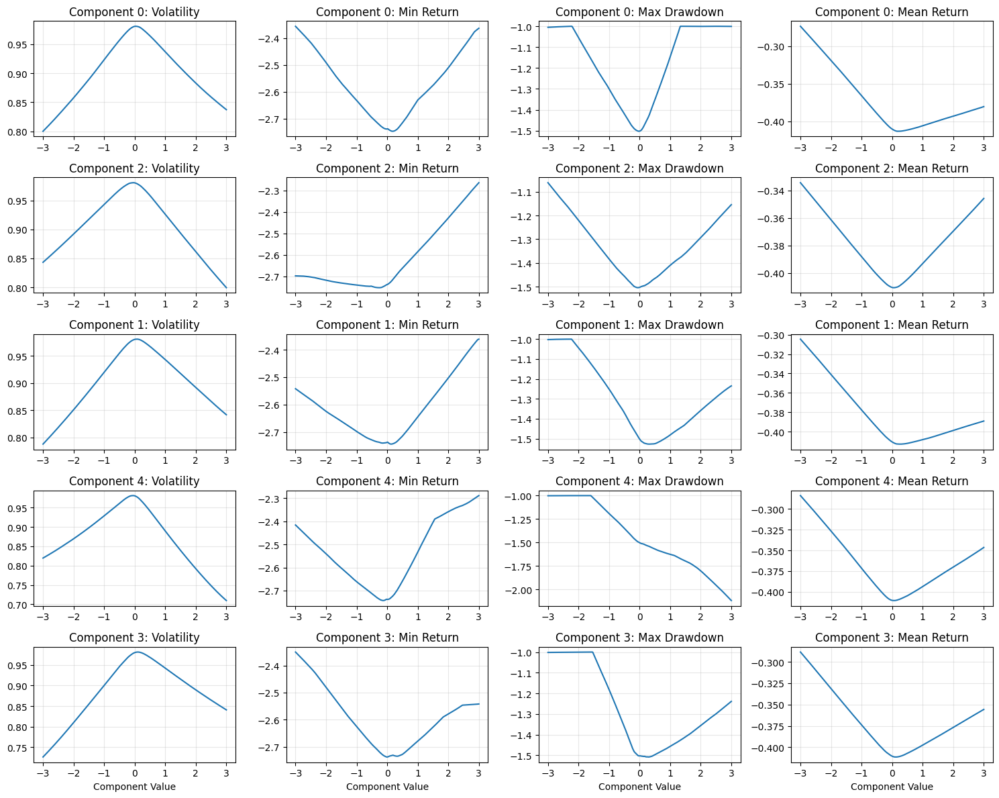

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


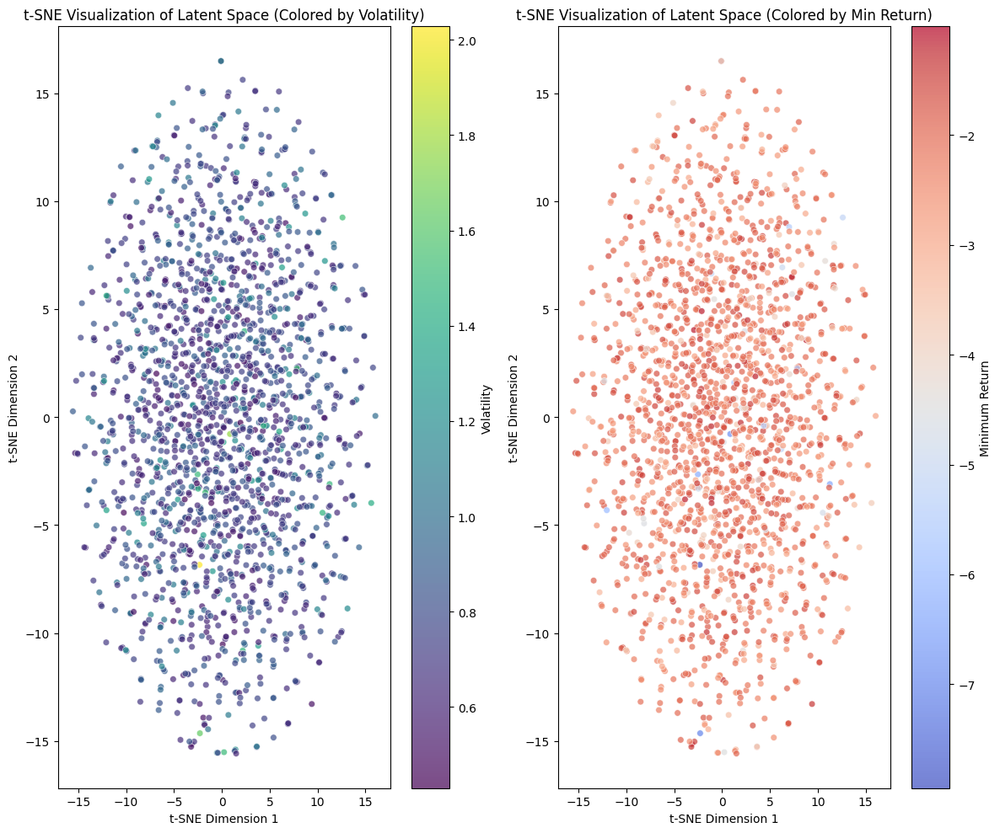

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


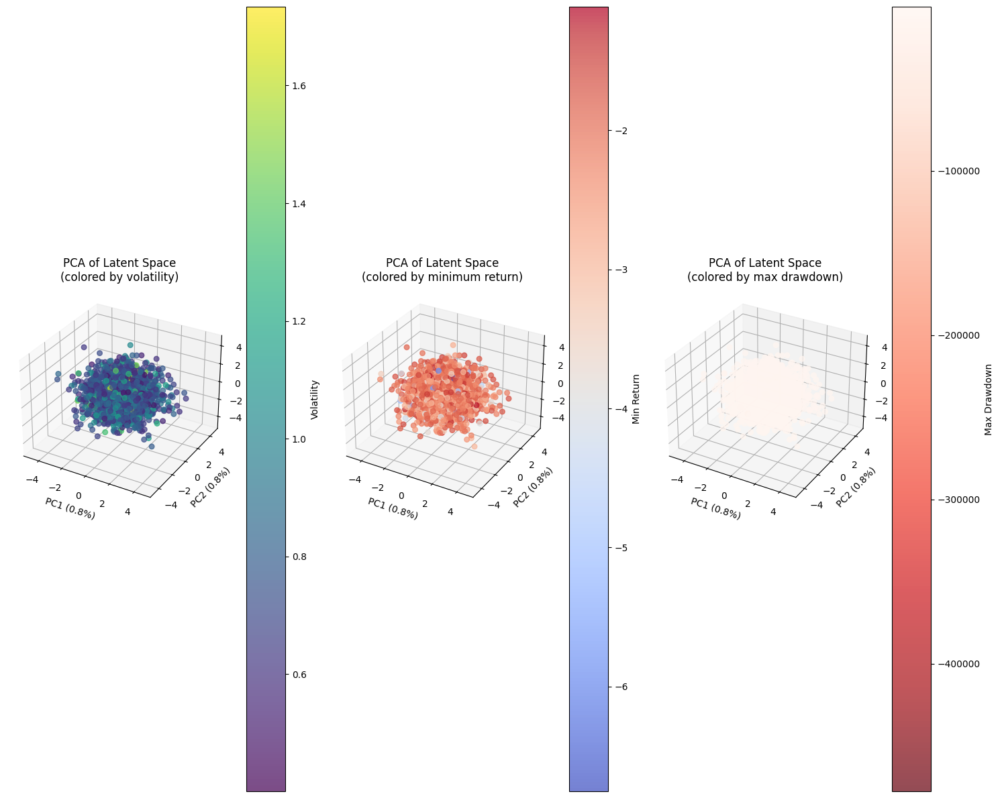

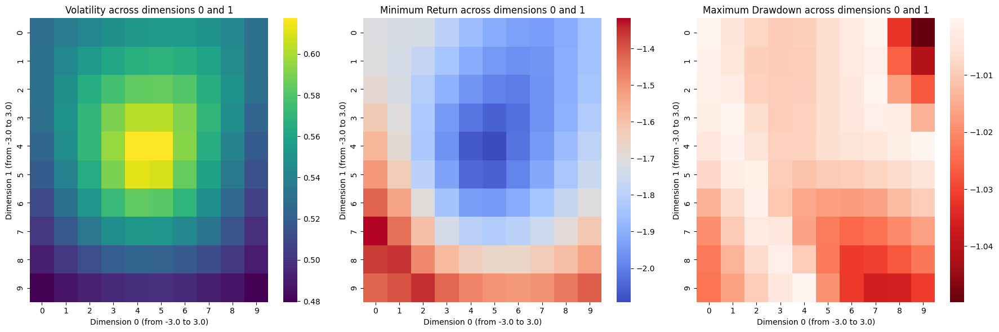

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  7.14it/s]


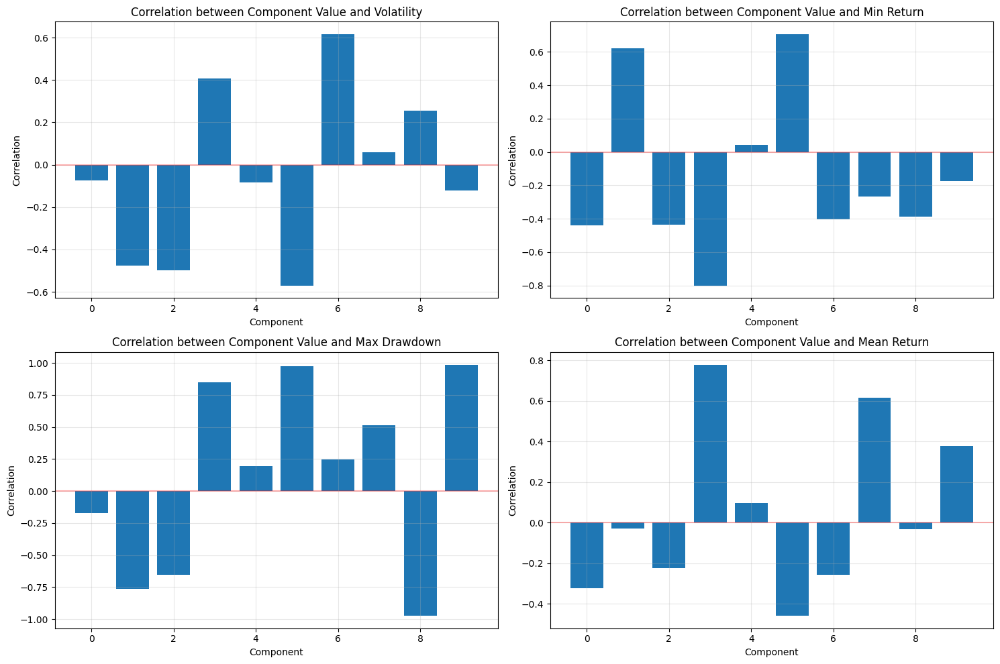

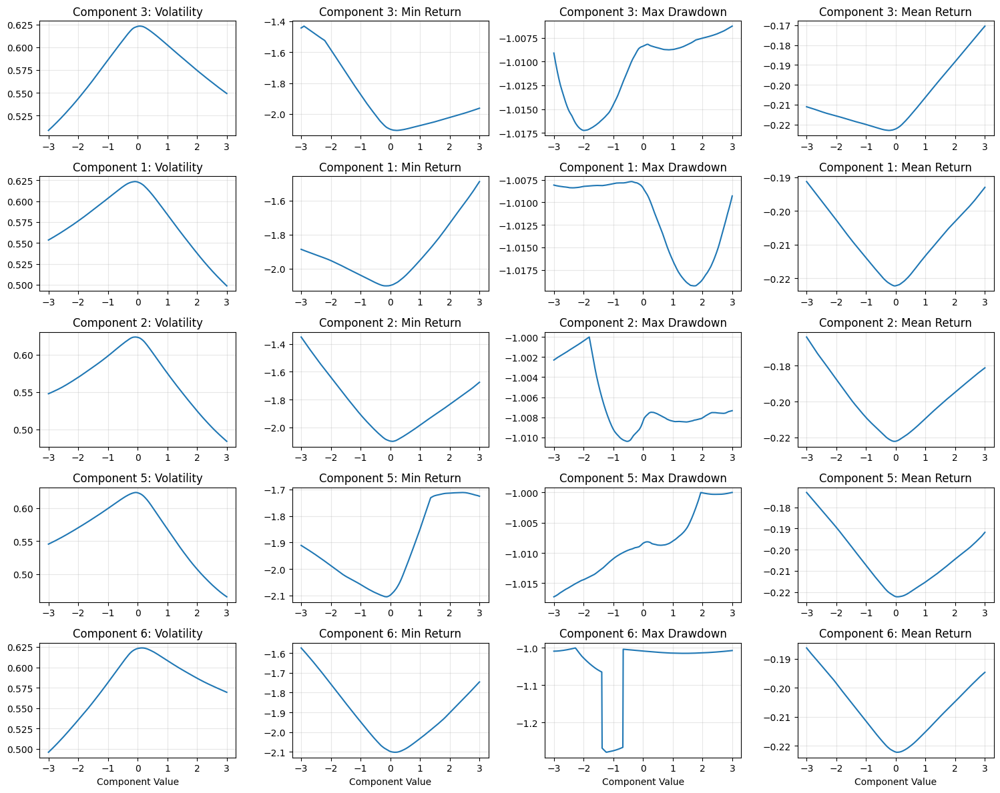

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


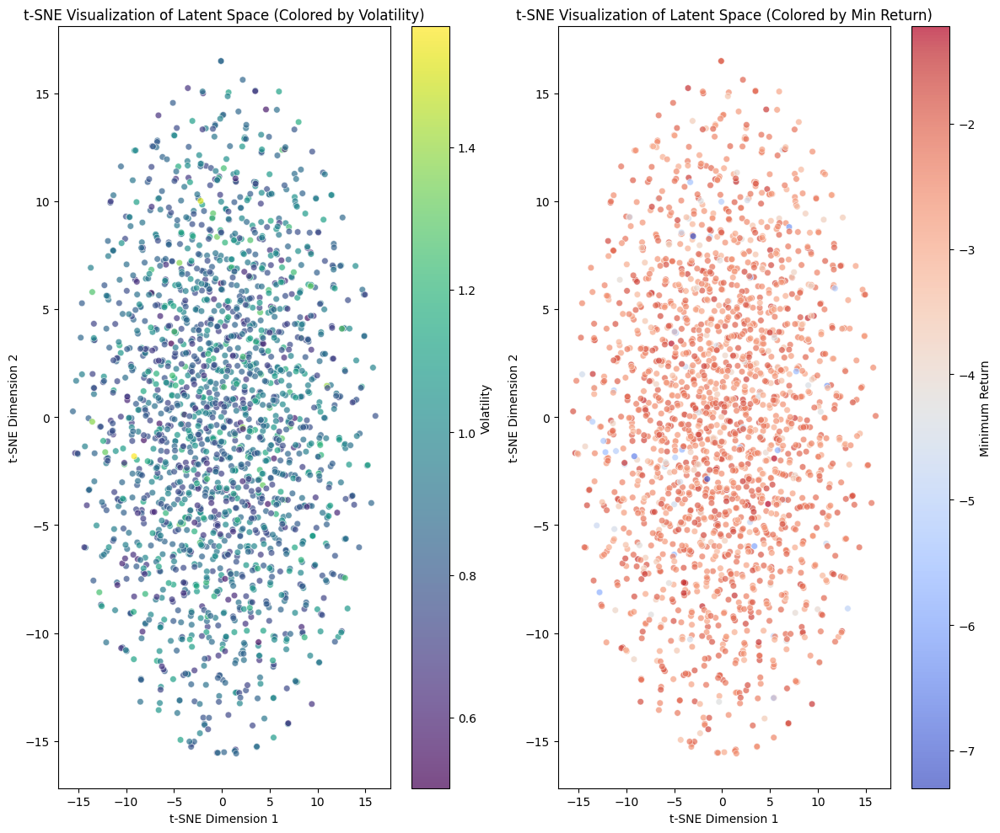

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


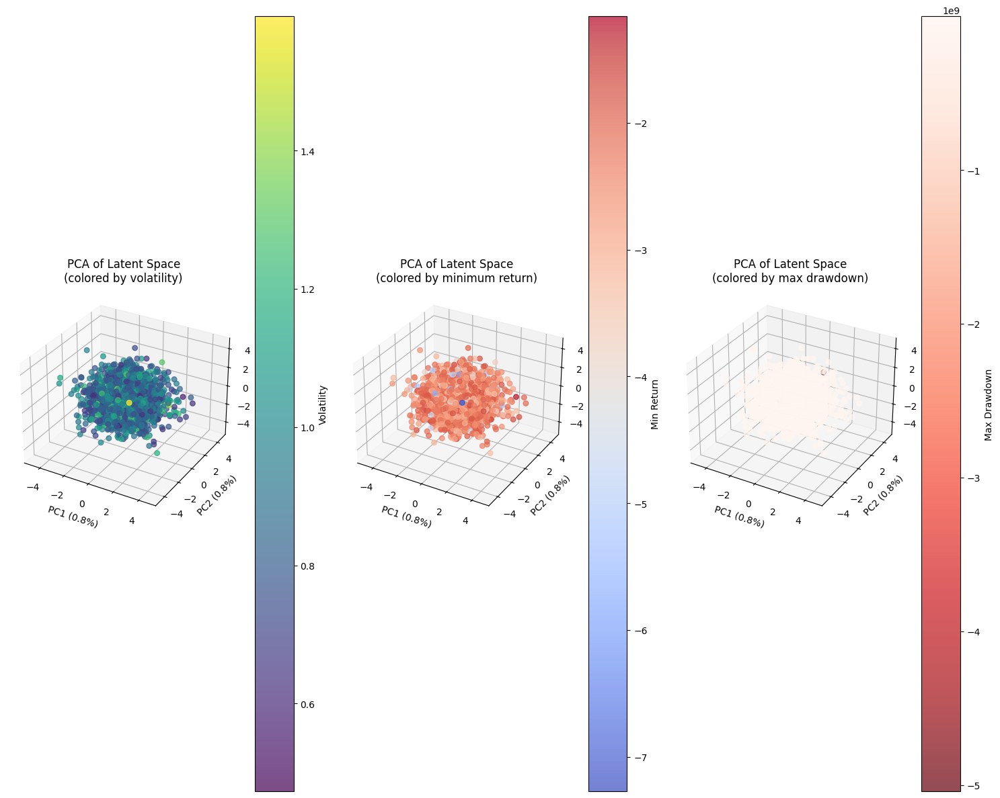

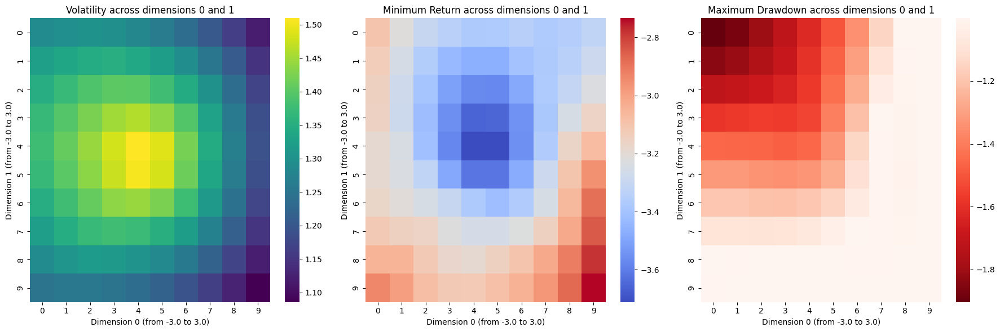

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  7.05it/s]


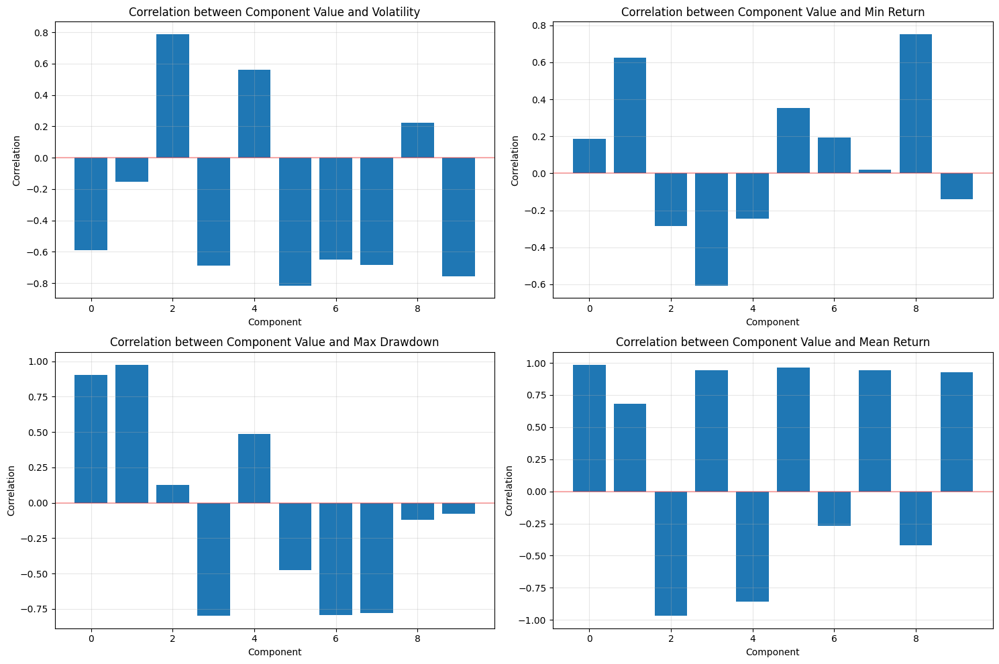

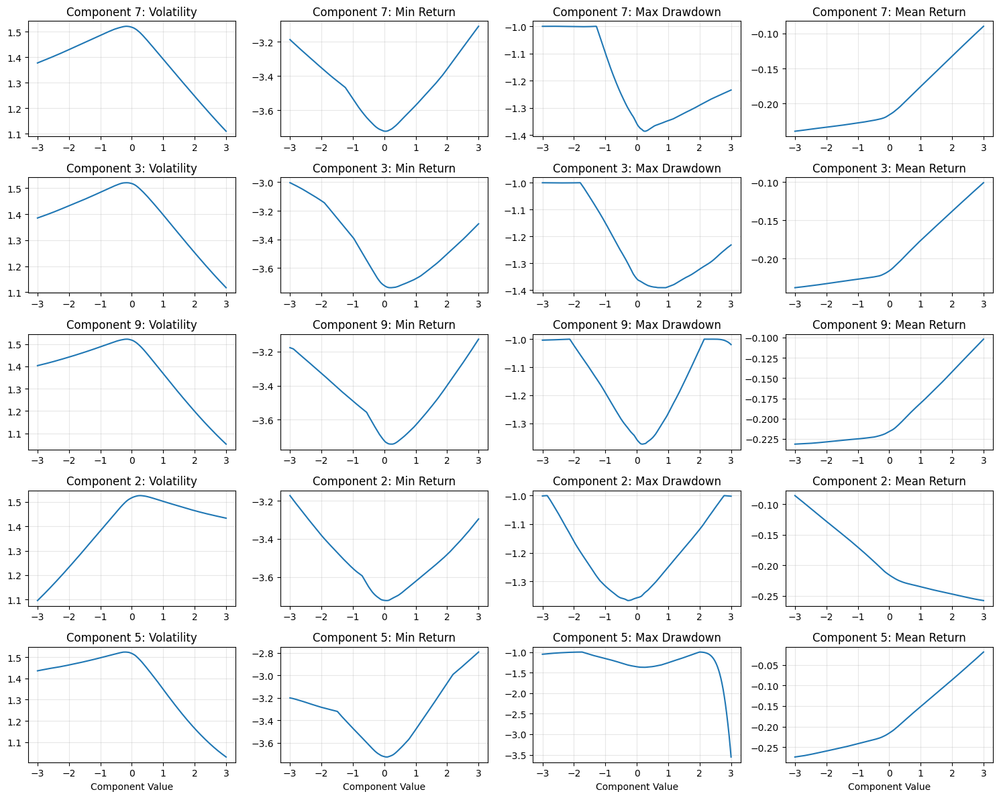

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


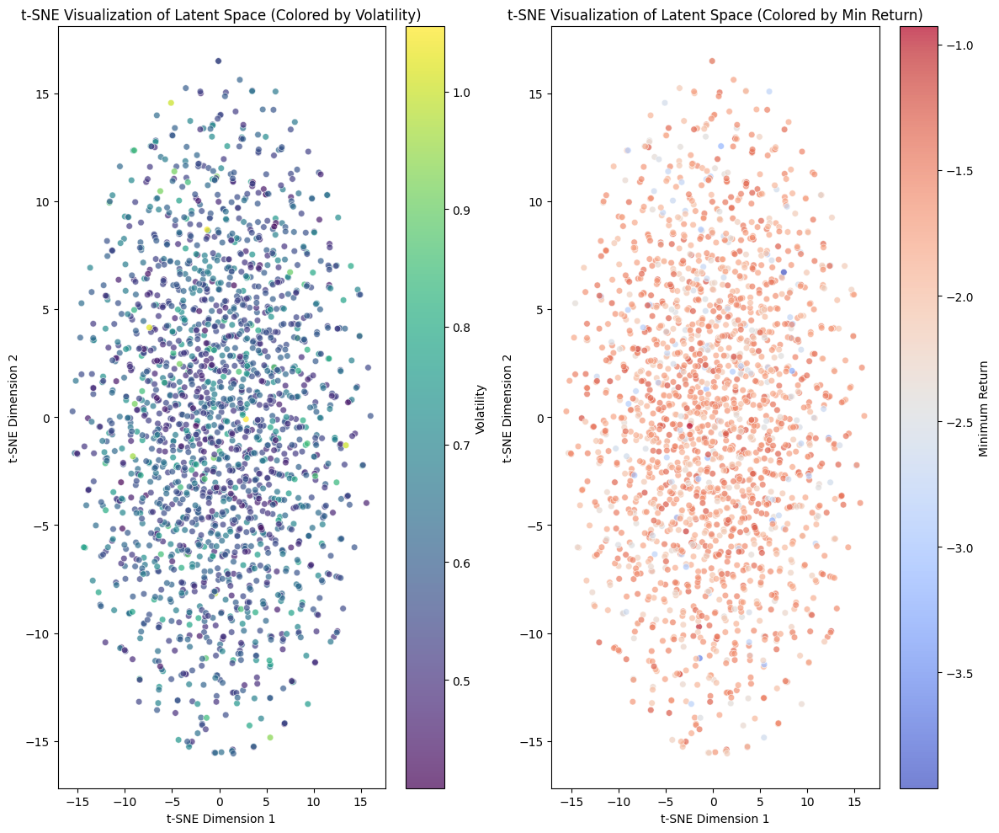

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


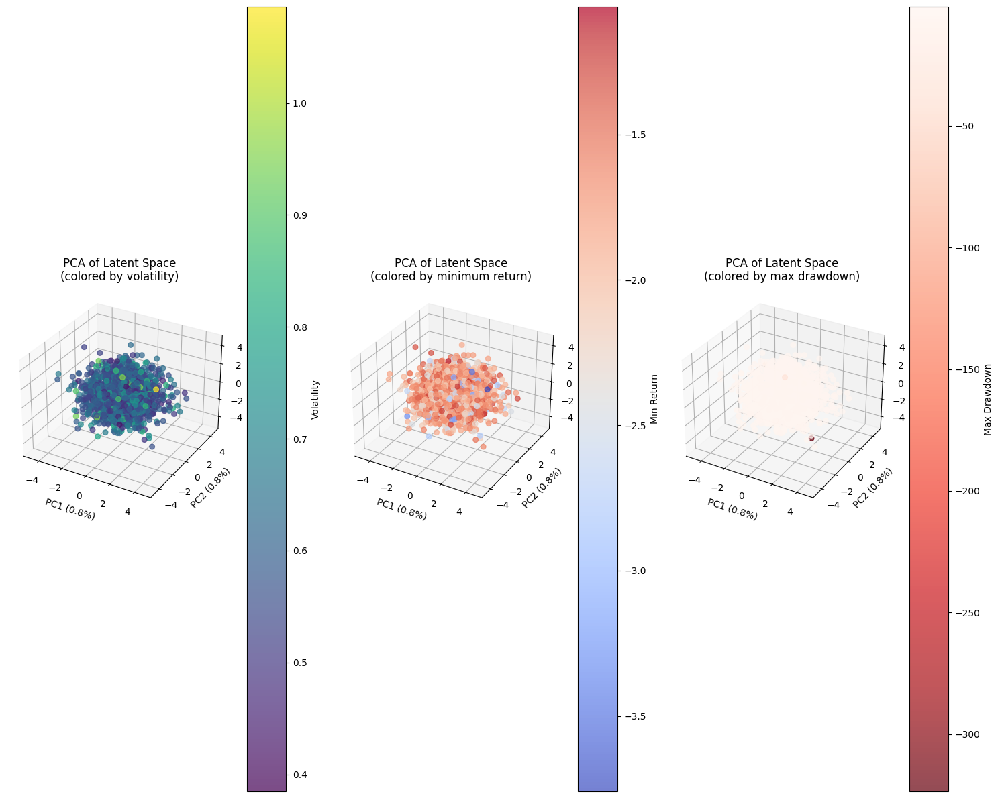

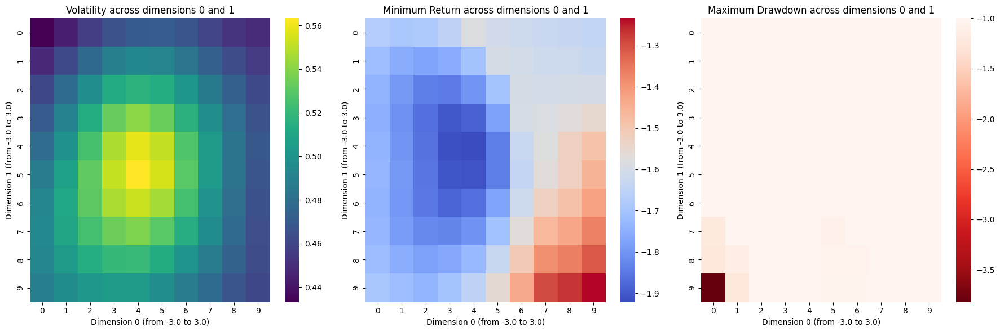

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  6.97it/s]


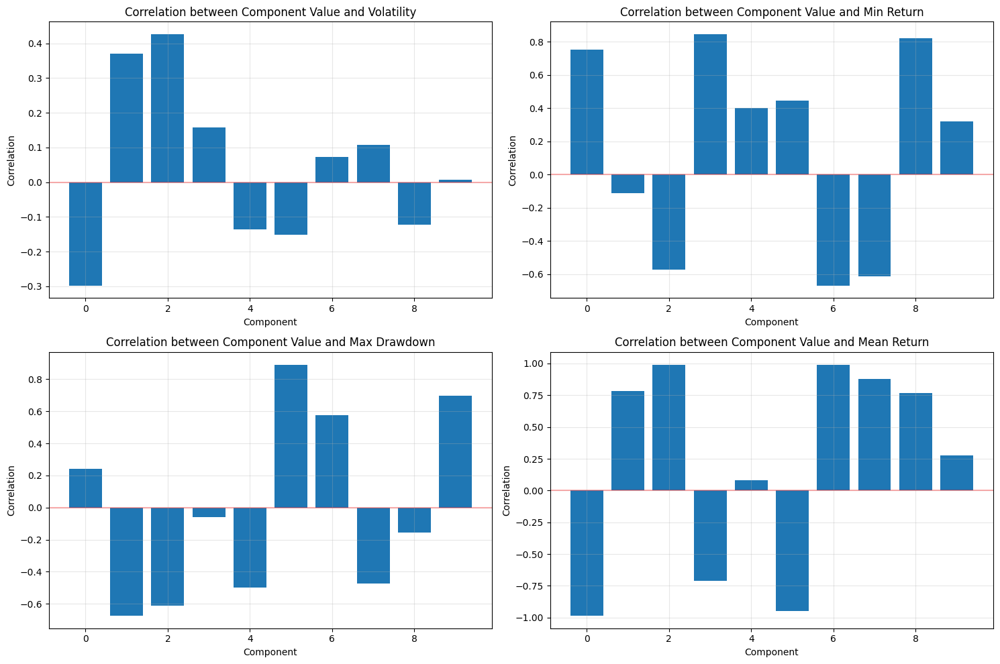

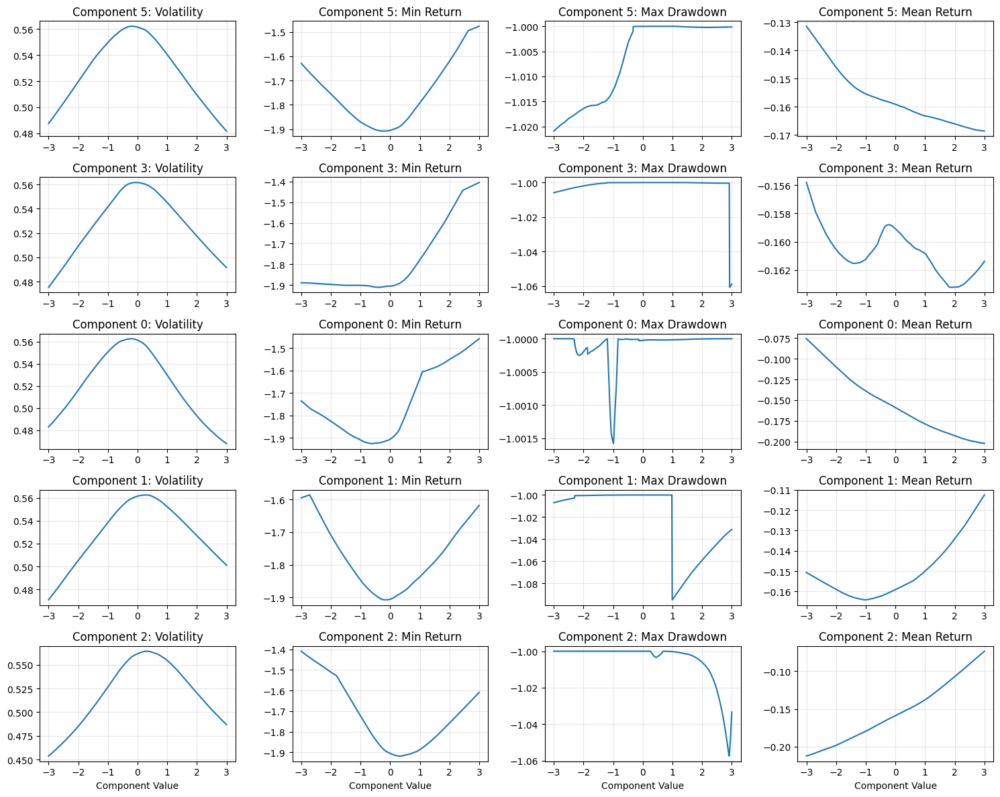

Generating latent samples...
Applying t-SNE to 2000 latent vectors...


c:\Users\nicka\master-thesis\packages\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


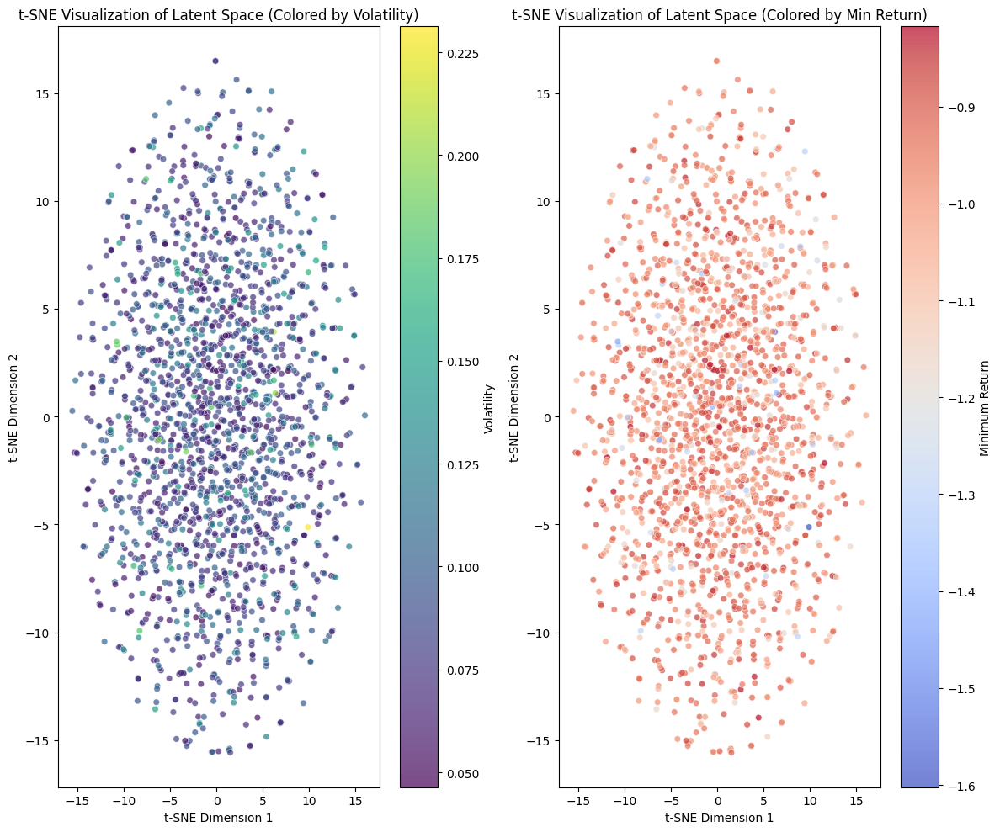

Generating latent samples...
Applying PCA to latent vectors...
Variance explained by first 3 PCs: 2.51%


c:\Users\nicka\master-thesis\internal_models\GANs\explainability\LatentSpaceVisualizer.py:175: RuntimeWarning: invalid value encountered in divide
  drawdowns = (cum_returns - running_max) / running_max


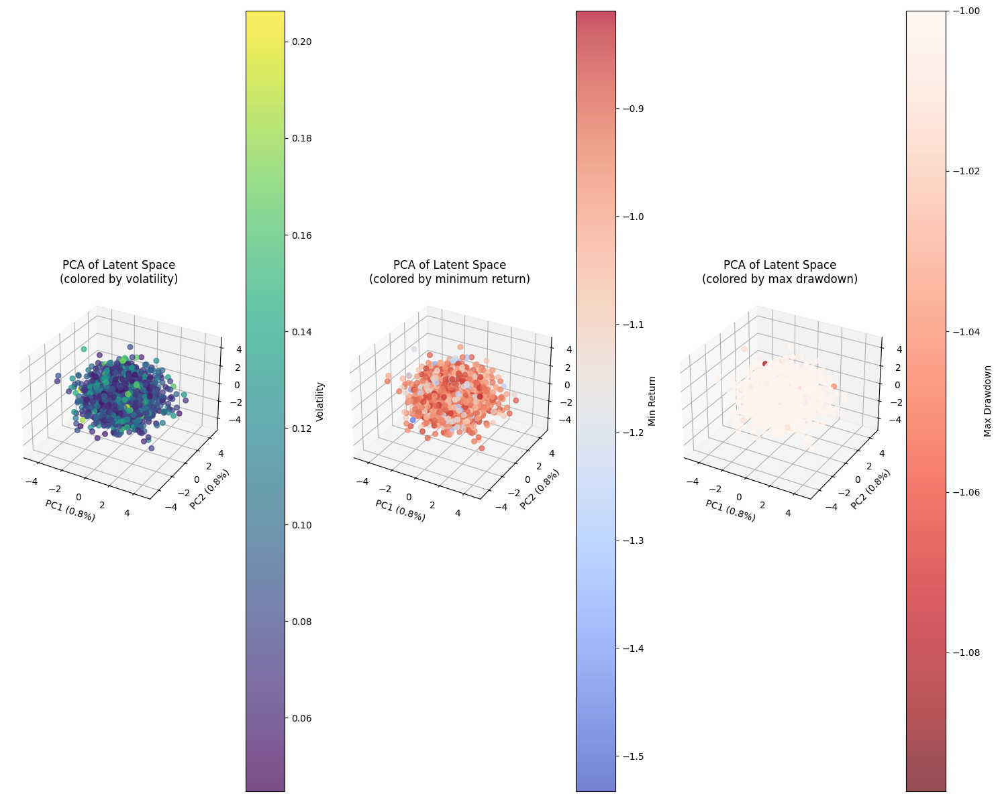

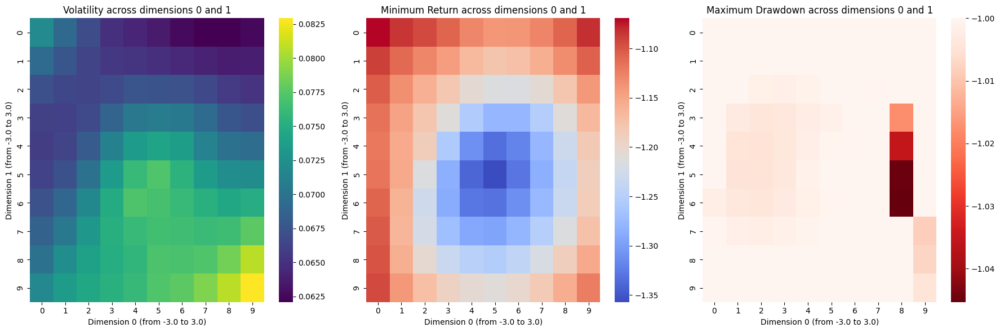

Analyzing latent components: 100%|██████████| 10/10 [00:01<00:00,  7.15it/s]


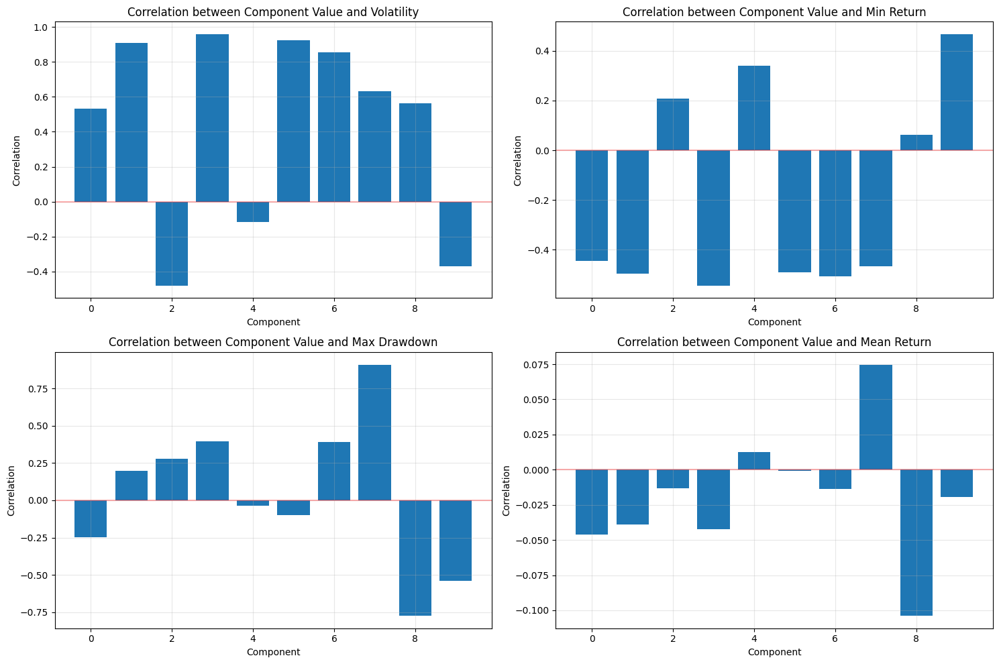

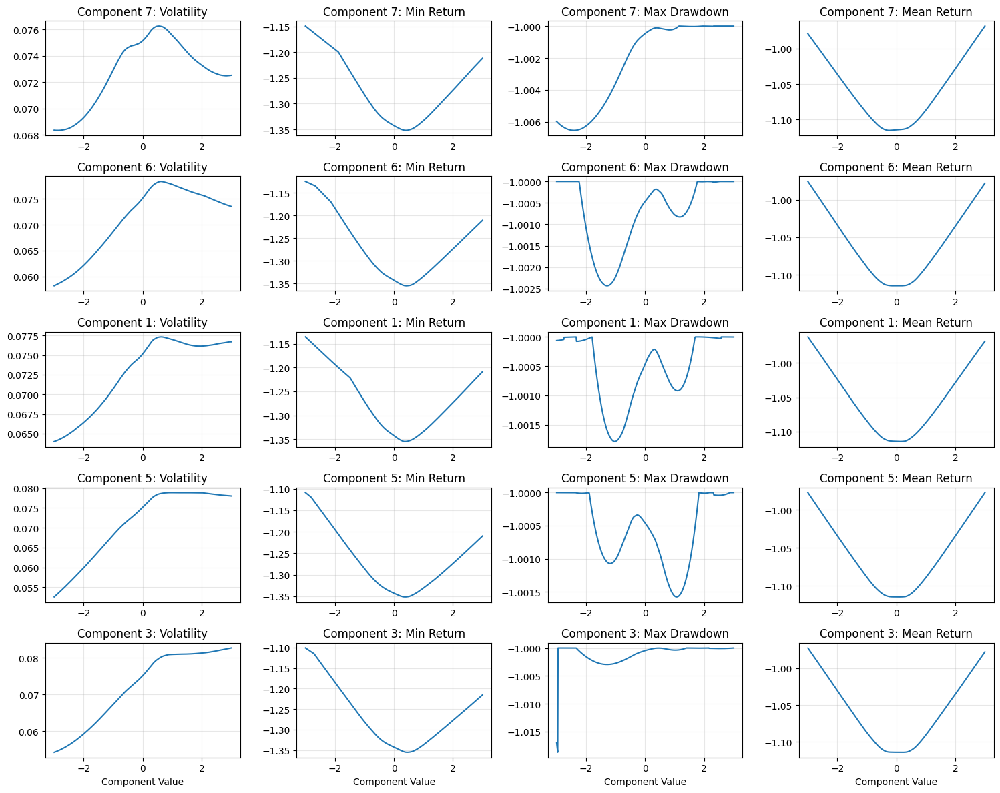

In [ ]:
from internal_models.GANs.explainability.LatentSpaceVisualizer import LatentSpaceVisualizer


for asset_name in gan_dict:
    gan = gan_dict[asset_name]
    #gen_returns = scenarios_results[asset_name]['scenarios_results']

    #explore_latent_space(gan, asset_name)
    #plot_tail_comparison(real_returns, gen_returns)
    # Create the visualizer
    visualizer = LatentSpaceVisualizer(gan, n_samples=2000)

    # Use t-SNE to visualize the latent space
    z_samples, z_tsne, gen_samples = visualizer.visualize_with_tsne(perplexity=30)

    # Use PCA to visualize the latent space in 3D
    z_samples, z_pca, gen_samples = visualizer.visualize_with_pca()

    # Analyze how traversing specific dimensions affects the output
    samples, vol, min_ret, max_dd = visualizer.latent_space_traversal(n_steps=10, dim1=0, dim2=1)

    # Analyze how individual latent dimensions affect the output
    metrics_df, correlations = visualizer.latent_component_analysis(n_components=10)
    



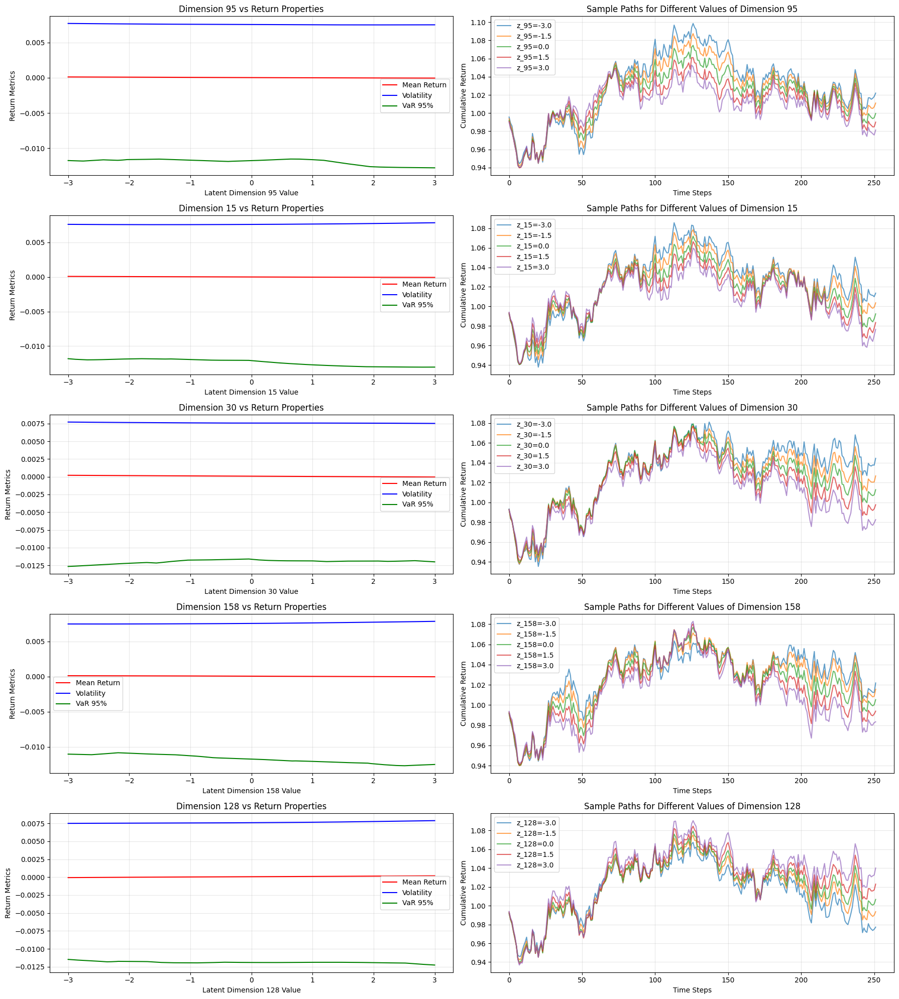

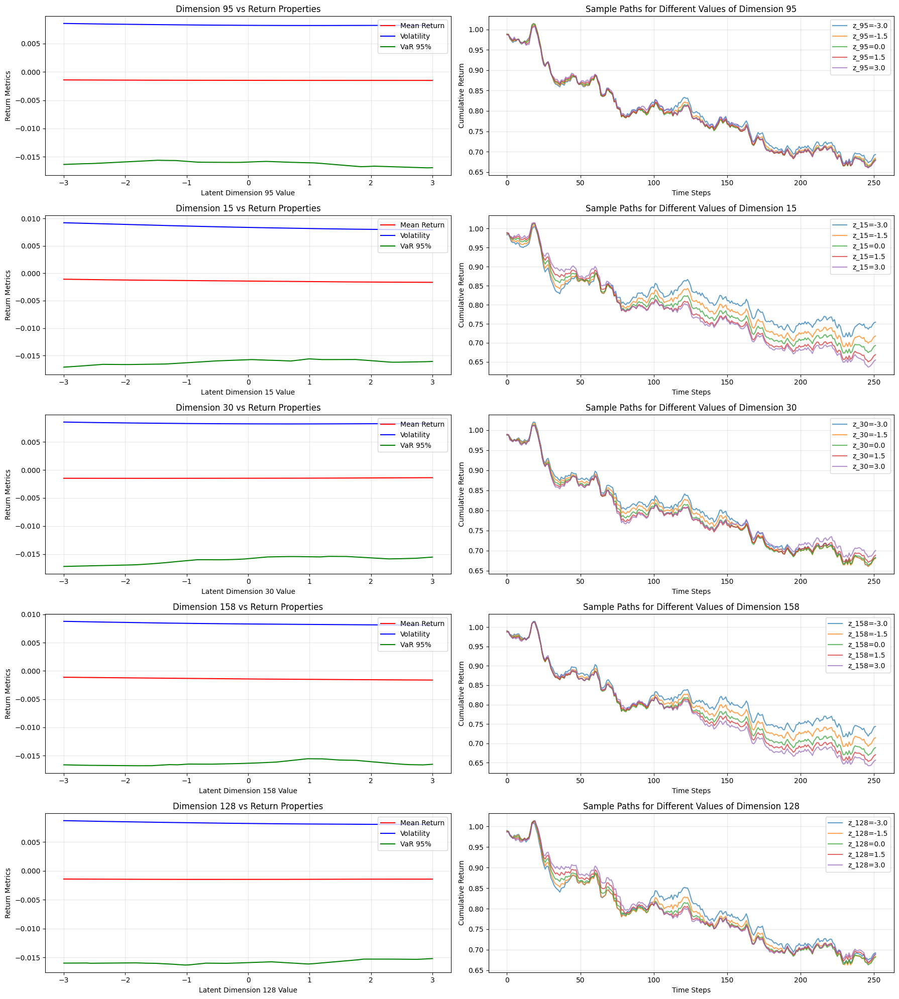

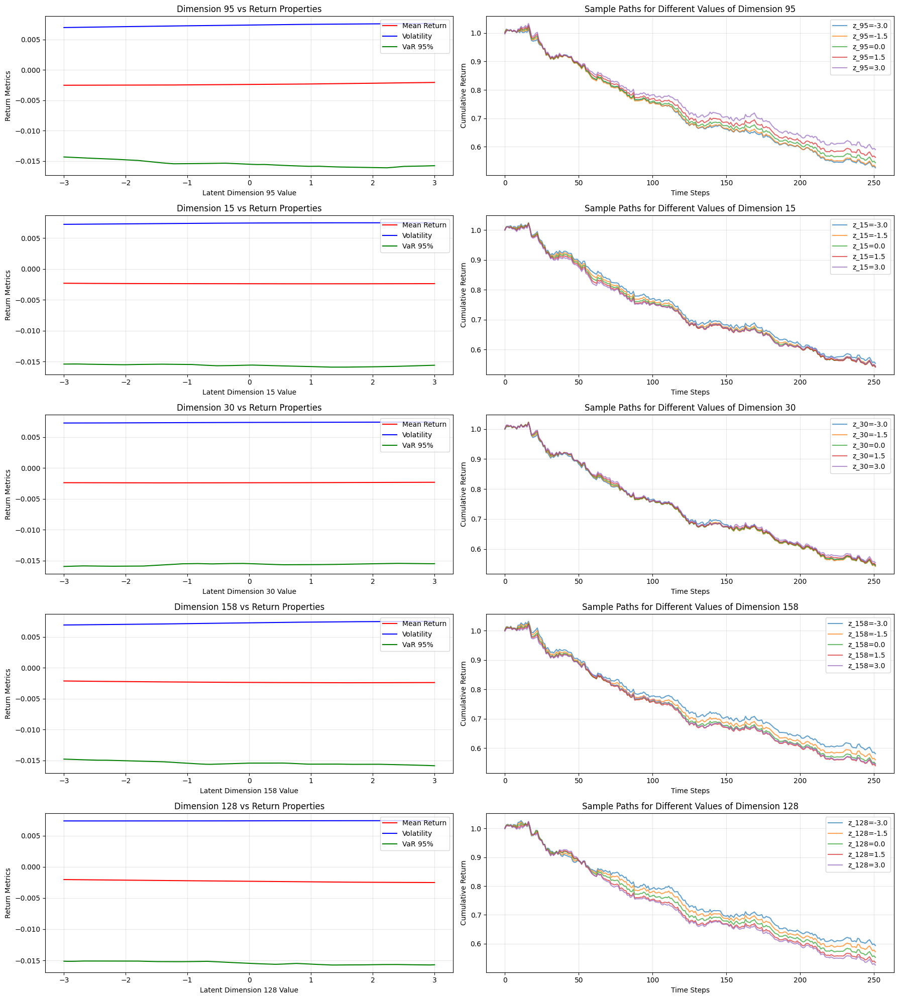

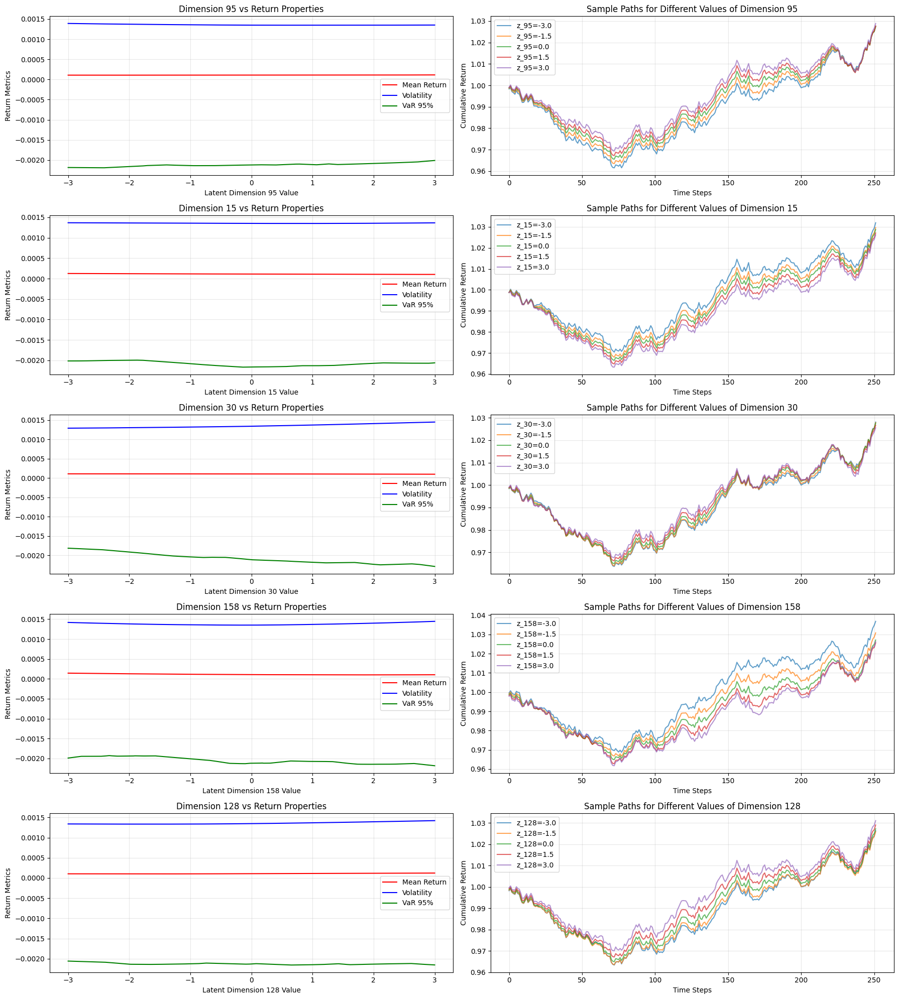

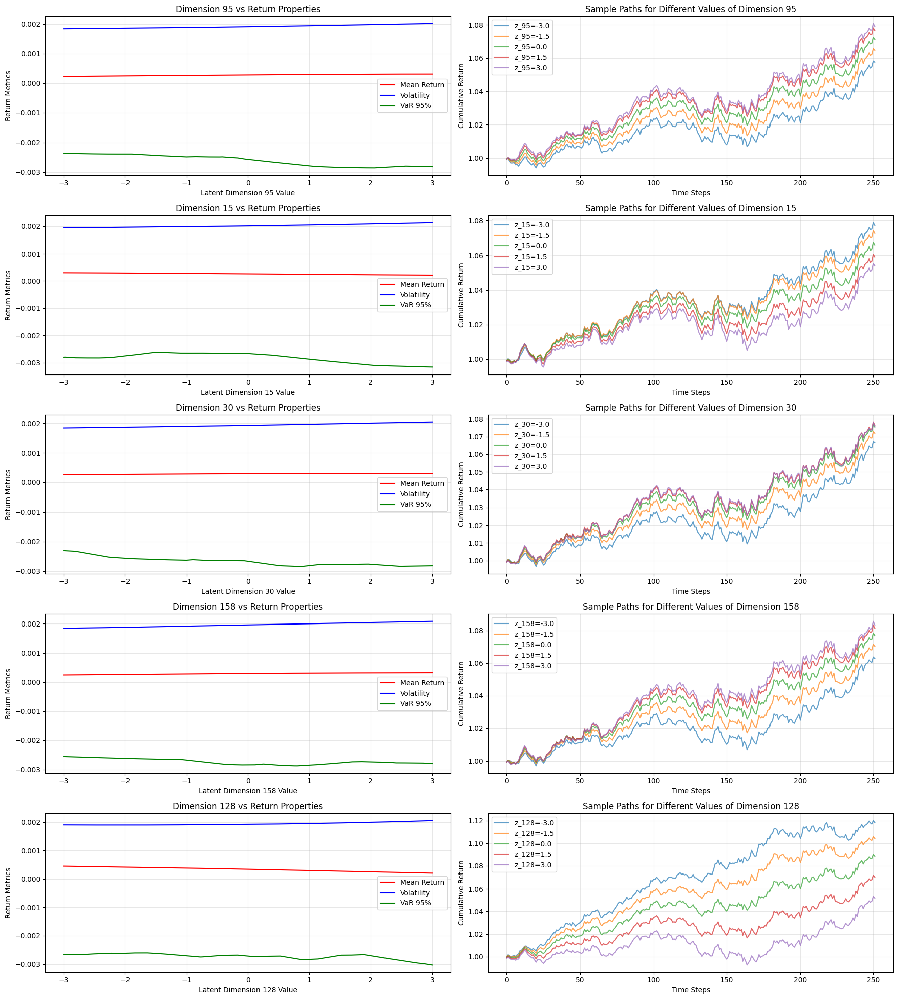

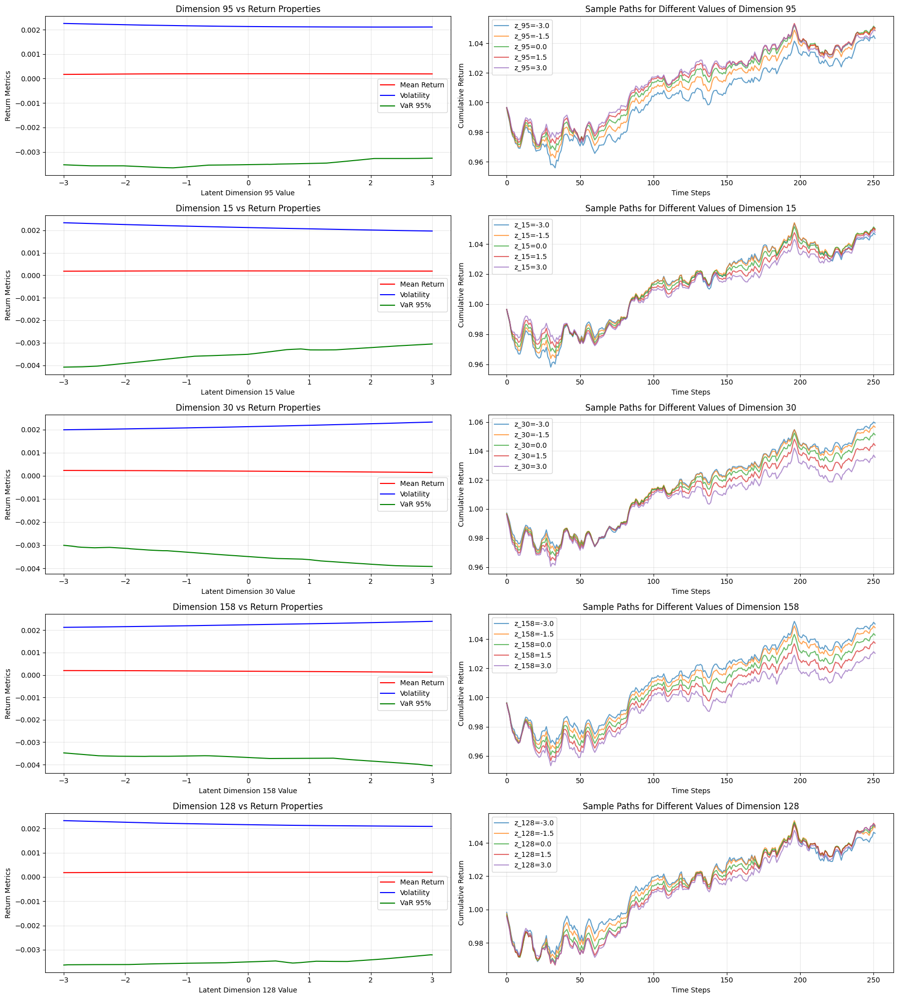

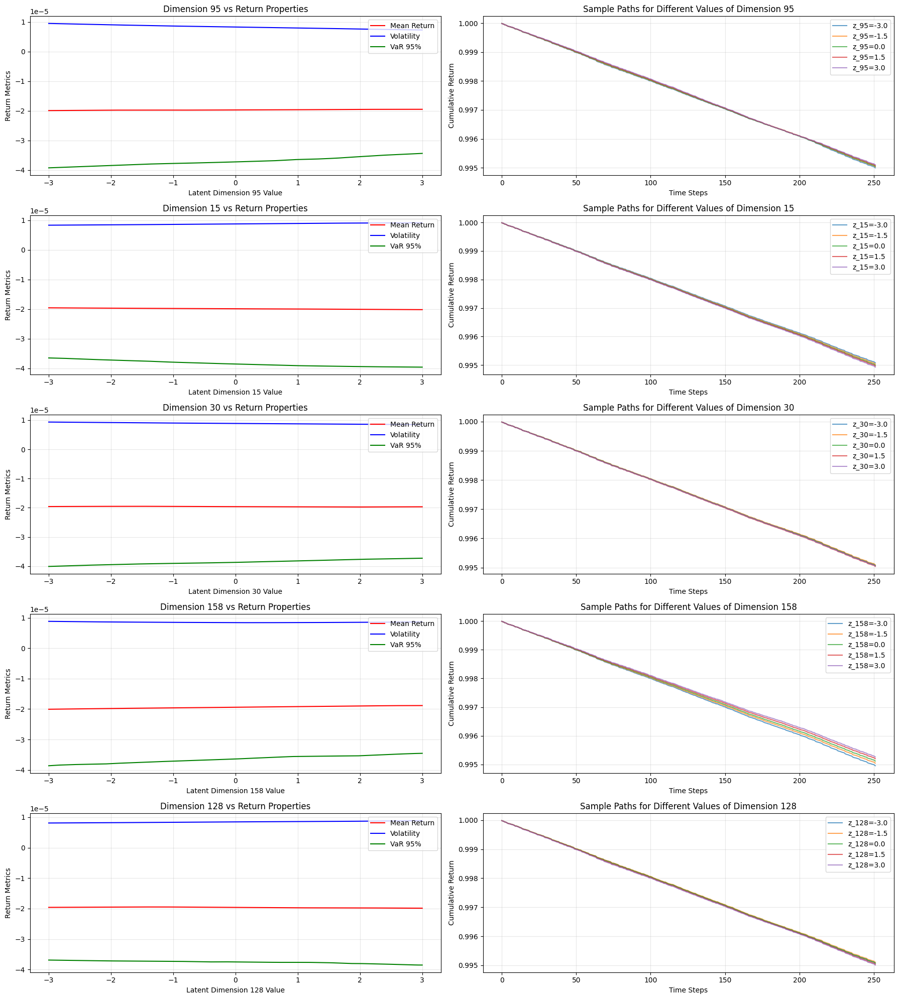

In [ ]:
for asset_name in gan_dict:
    gan_model = gan_dict[asset_name]
    explore_latent_space(gan_model, asset_name)